In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


<h1 style="text-align: center;">
Smart Shopping Assistant (BasketHealthAI)
</h1>

<h3 style="text-align: center;">
Vision-based Grocery Basket Analysis with Health-Aware Recommendations
</h3>

<p style="text-align: center;">
Rakesh Kumar | M.Tech Artificial Intelligence  
SRM Institute of Science and Technology
</p>

<h2 style="text-align: center;">1. Problem Statement</h2>

Modern grocery shopping lacks real-time insights into the overall health quality of a consumer's basket.

Current limitations:
- No automated understanding of multiple items in a shopping cart
- Nutrition decisions are made post-purchase rather than pre-purchase
- Existing systems rely on manual product lookup or barcode scanning

This project aims to bridge this gap by enabling:
- Real-time multi-item detection from basket images
- Health-aware categorization of detected products
- Intelligent recommendation of healthier alternatives

<h2 style="text-align: center;">2. System Overview</h2>

The proposed system follows a multi-stage pipeline:

1. Image Capture (Basket Image)
2. Object Detection (YOLOv8)
3. Category Mapping (Health-oriented classes)
4. SKU Mapping (6K product database)
5. Health Scoring Engine
6. Subtype-aware Recommendation Engine

Output:
- Cart-level health score
- Item-wise analysis
- Healthier alternative suggestions

<h2 style="text-align: center;">3. Dataset Strategy</h2>

A hybrid dataset strategy was adopted to balance generalization and real-world applicability.

### Retail Dataset (~6–7K Images)
- Structured product images
- Clean backgrounds and clear object boundaries
- Used to train a strong baseline detection model

### Custom Basket Dataset (~200 Images)
- Real-world shopping cart scenarios
- Multiple items, occlusion, clutter
- Manually annotated to reflect practical usage conditions

### Rationale
- Retail dataset → strong feature learning
- Custom dataset → real-world adaptation

<h2 style="text-align: center;">4. Baseline Model Training on Retail Dataset (6K Images)</h2>

To establish a strong detection baseline, a YOLOv8 model was first trained on a larger retail grocery dataset containing approximately 6–7K product images.

This stage was important for three reasons:

- to learn generic visual representations of packaged grocery products
- to validate the feasibility of multi-class grocery detection
- to use the trained weights as initialization for later adaptation to cluttered basket images

The retail dataset primarily contains cleaner product views compared to basket images. As a result, it provides a strong starting point for feature learning, but does not fully represent real-world shopping cart conditions such as overlap, occlusion, and clutter.

<h2 style="text-align: center;">4.1 Utility cells for run inspection</h2>

In [ ]:
import os
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt

def inspect_yolo_run(run_dir):
    print("=" * 80)
    print("RUN DIRECTORY:", run_dir)
    print("=" * 80)

    if not os.path.exists(run_dir):
        print("Run directory not found.")
        return None

    files = sorted(os.listdir(run_dir))
    print("\nFiles in run directory:")
    for f in files:
        print(" -", f)

    results_csv = os.path.join(run_dir, "results.csv")
    if os.path.exists(results_csv):
        df = pd.read_csv(results_csv)
        print("\nresults.csv found")
        print("Columns:", df.columns.tolist())
        print("\nLast 5 rows:")
        print(df.tail())
        return df
    else:
        print("\nresults.csv not found")
        return None

def summarize_results_csv(results_df):
    if results_df is None or len(results_df) == 0:
        print("No results dataframe available.")
        return

    cols = results_df.columns.tolist()
    metric_candidates = [
        "metrics/precision(B)",
        "metrics/recall(B)",
        "metrics/mAP50(B)",
        "metrics/mAP50-95(B)"
    ]

    present = [c for c in metric_candidates if c in cols]
    if not present:
        print("\nExpected metric columns not found exactly. Showing last row only:")
        print(results_df.tail(1).T)
        return

    best_idx = results_df["metrics/mAP50-95(B)"].idxmax()
    best_row = results_df.loc[best_idx]
    last_row = results_df.iloc[-1]

    print("\nBest epoch summary:")
    print(f"Epoch            : {best_row.get('epoch', best_idx)}")
    print(f"Precision        : {best_row['metrics/precision(B)']:.4f}")
    print(f"Recall           : {best_row['metrics/recall(B)']:.4f}")
    print(f"mAP50            : {best_row['metrics/mAP50(B)']:.4f}")
    print(f"mAP50-95         : {best_row['metrics/mAP50-95(B)']:.4f}")

    print("\nFinal epoch summary:")
    print(f"Epoch            : {last_row.get('epoch', len(results_df)-1)}")
    print(f"Precision        : {last_row['metrics/precision(B)']:.4f}")
    print(f"Recall           : {last_row['metrics/recall(B)']:.4f}")
    print(f"mAP50            : {last_row['metrics/mAP50(B)']:.4f}")
    print(f"mAP50-95         : {last_row['metrics/mAP50-95(B)']:.4f}")

def show_standard_yolo_outputs(run_dir):
    standard_files = [
        "results.png",
        "confusion_matrix.png",
        "confusion_matrix_normalized.png",
        "PR_curve.png",
        "F1_curve.png",
        "P_curve.png",
        "R_curve.png",
    ]

    available = [f for f in standard_files if os.path.exists(os.path.join(run_dir, f))]

    if not available:
        print("No standard YOLO output images found.")
        return

    plt.figure(figsize=(14, 5 * len(available)))
    for i, fname in enumerate(available, 1):
        img = Image.open(os.path.join(run_dir, fname))
        plt.subplot(len(available), 1, i)
        plt.imshow(img)
        plt.title(fname)
        plt.axis("off")

    plt.tight_layout()
    plt.show()

def show_images_from_folder(folder_path, n=4, title=None):
    if not os.path.exists(folder_path):
        print("Folder not found:", folder_path)
        return

    imgs = [f for f in os.listdir(folder_path) if f.lower().endswith((".jpg", ".jpeg", ".png"))]
    imgs = sorted(imgs)

    if len(imgs) == 0:
        print("No images found in:", folder_path)
        return

    imgs = imgs[:n]

    plt.figure(figsize=(16, 4 * len(imgs)))
    for i, img_name in enumerate(imgs, 1):
        img_path = os.path.join(folder_path, img_name)
        img = Image.open(img_path)

        plt.subplot(len(imgs), 1, i)
        plt.imshow(img)
        plt.title(img_name if title is None else f"{title} - {img_name}")
        plt.axis("off")

    plt.tight_layout()
    plt.show()

<h3 style="text-align: center;">4.1 Dataset Summary</h3>

The baseline model was trained on a large retail grocery dataset containing approximately 6–7K images out of which 3115 images qualified for packaged food training as rest were non food items.  
These images mainly represent individual product instances with relatively clean presentation compared to basket scenes.

This dataset was used to learn strong product-level visual features before moving to the more difficult custom basket setting.

In [ ]:
DATASET_3K_PATH = "/content/drive/MyDrive/final_year_project/filtered_yolo_dataset"

print("Dataset path exists:", os.path.exists(DATASET_6K_PATH))

train_img_dir = os.path.join(DATASET_3K_PATH, "train", "images")
val_img_dir = os.path.join(DATASET_3K_PATH, "valid", "images")

if os.path.exists(train_img_dir):
    print("Train images:", len(os.listdir(train_img_dir)))
else:
    print("Train image directory not found:", train_img_dir)

if os.path.exists(val_img_dir):
    print("Validation images:", len(os.listdir(val_img_dir)))
else:
    print("Validation image directory not found:", val_img_dir)

Dataset path exists: True
Train images: 3115
Validation image directory not found: /content/drive/MyDrive/final_year_project/filtered_yolo_dataset/valid/images


<h3 style="text-align: center;">4.2 Training Configuration</h3>

The baseline detector was trained using YOLOv8n to balance detection capability with lightweight deployment constraints.

Typical training configuration:
- Model: YOLOv8n
- Image size: 640
- Batch size: 8
- Optimizer: AdamW
- Hardware: Google Colab (Tesla T4)

This stage focused on building a reliable retail-product detector that could later be adapted for custom basket images.

In [ ]:
from ultralytics import YOLO

# Load YOLOv8 nano variant.
# This baseline model is trained on the larger retail dataset to learn
# generic grocery product representations before adapting to basket scenes.
model = YOLO("yolov8n.pt")

# Baseline training on the retail grocery dataset.
# The objective here is not final deployment performance, but stable feature learning
# across common packaged grocery categories




In [ ]:
from ultralytics import YOLO

# Load last trained model
# Load YOLOv8 nano variant.
# This baseline model is trained on the larger retail dataset to learn
# generic grocery product representations before adapting to basket scenes.
model = YOLO("/content/final_runs/grocery_final_clean_v3/weights/last.pt")
# Baseline training on the retail grocery dataset.
# The objective here is not final deployment performance, but stable feature learning
# across common packaged grocery categories
# Train
model.train(
    data="/content/filtered_yolo_dataset/data.yaml",
    epochs=100,
    imgsz=832,
    batch=8,
    device=0,  # change to 'cpu' if GPU not available

    # Resume training
    resume=True,

    # Augmentation (important for your imbalance)
    augment=True,
    hsv_h=0.015,
    hsv_s=0.7,
    hsv_v=0.4,
    fliplr=0.5,
    mosaic=1.0,
    mixup=0.1,

    # Optimization
    optimizer="AdamW",
    lr0=0.001,
    cos_lr=True,

    # Stability
    patience=20,
    workers=4,

    # Save to Drive
    project="/content/drive/MyDrive/final_year_project/final_runs",
    name="grocery_final_clean_v3_aug",
    exist_ok=True
)

Ultralytics 8.4.26 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/filtered_yolo_dataset/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=100, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=832, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/content/final_runs/grocery_final_clean_v3/weights/last.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=grocery_final_clean_v3, nbs=64, nms=False, opset=None, opt

<h3 style="text-align: center;">4.3 Baseline Validation Results</h3>

The saved training run is inspected below to document the baseline validation metrics and generated evaluation plots.

These results represent performance on the structured retail dataset and serve as the reference point before adaptation to cluttered basket images.

In [ ]:
RUN_3K = "/content/drive/MyDrive/final_year_project/final_runs/grocery_final_clean_v3"

df_3k = inspect_yolo_run(RUN_3K)
summarize_results_csv(df_3k)

RUN DIRECTORY: /content/drive/MyDrive/final_year_project/final_runs/grocery_final_clean_v3

Files in run directory:
 - args.yaml
 - labels.jpg
 - results.csv
 - train_batch0.jpg
 - train_batch1.jpg
 - train_batch2.jpg
 - train_batch28440.jpg
 - train_batch28441.jpg
 - train_batch28442.jpg
 - weights

results.csv found
Columns: ['epoch', 'time', 'train/box_loss', 'train/cls_loss', 'train/dfl_loss', 'metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)', 'metrics/mAP50-95(B)', 'val/box_loss', 'val/cls_loss', 'val/dfl_loss', 'lr/pg0', 'lr/pg1', 'lr/pg2']

Last 5 rows:
    epoch     time  train/box_loss  train/cls_loss  train/dfl_loss  \
93     94  13283.3         1.11368         0.80781         1.13455   
94     95  13478.3         1.11796         0.81195         1.14049   
95     96  13669.5         1.11665         0.81066         1.14174   
96     97  13865.5         1.10908         0.80125         1.14033   
97     98  14060.3         1.10522         0.79372         1.13474   

<h3 style="text-align: center;">4.4 Qualitative Results</h3>

A few example outputs from the retail dataset are shown below to illustrate the baseline detector performance on structured product images.

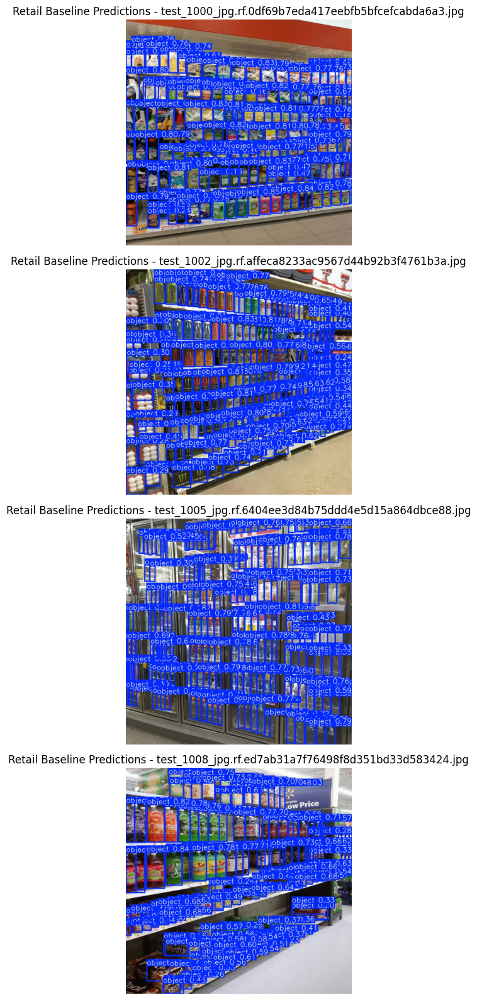

In [ ]:
PRED_3K = "/content/drive/MyDrive/final_year_project/final_evaluation/predictions"

show_images_from_folder(PRED_3K, n=4, title="Retail Baseline Predictions")

<h3 style="text-align: center;">4.5 Interpretation of Baseline Results</h3>

The baseline YOLOv8 model demonstrated stable and reliable performance on the retail dataset, confirming its ability to learn general grocery product representations.

### Key Observations

- The model achieved a **mAP@0.5 of ~0.64** and **mAP@0.5:0.95 of ~0.45**, indicating good localization and detection capability under structured conditions.
- Precision reached **~0.79**, showing strong confidence in predicted detections.
- Recall remained moderate (**~0.56–0.58**), suggesting that while most detections are accurate, some instances are still missed, which is expected in multi-class detection tasks.
- Training and validation losses show stable convergence, indicating no major overfitting.

### Interpretation

These results confirm that the model is effective in detecting retail products when:
- objects are clearly visible
- background clutter is minimal
- product instances are relatively isolated

The trained model serves as a strong initialization point for further adaptation.

### Important Insight

Despite achieving good performance on this dataset, the model is not directly suitable for real-world basket analysis due to differences in scene complexity.

This gap highlights the need for:
- custom basket-level data
- class restructuring aligned with nutritional categories
- improved handling of overlapping and occluded objects

<h2 style="text-align: center;">5. Limitations Observed in Real Basket Scenarios</h2>

The initial training dataset primarily consists of planogram-style or shelf-based retail images, where products are well-organized, clearly visible, and minimally overlapping.

While this type of data is effective for learning basic product-level features, it does not reflect real-world basket scenarios.

In practical shopping environments:
- multiple items are placed together
- objects overlap and partially occlude each other
- item orientation and visibility vary significantly

To address this gap, a custom dataset of basket images (~200 samples) was manually collected and annotated.

This dataset specifically captures:
- occlusion between items
- overlapping product arrangements
- cluttered basket conditions

This step represents a critical part of the system design, as handling such complexity is significantly more challenging than standard object detection on structured retail images.

The model was then fine-tuned on this custom dataset to improve robustness under real-world conditions.

Handling occlusion and overlapping items in basket scenarios represents the most challenging aspect of this problem, and forms the core focus of the proposed approach.

<h3 style="text-align: center;">
Custom Dataset Creation for Real-World Basket Scenarios
</h3>

The baseline dataset used for initial training primarily consists of structured retail images (planogram/shelf layouts), where products are clearly visible with minimal overlap.

However, real-world shopping baskets present significantly different conditions:
- multiple items placed together in a single frame
- partial visibility due to overlapping objects
- varying orientations and cluttered arrangements

These conditions introduce challenges such as:
- occlusion
- class confusion
- missed detections

To address this gap, a custom dataset was created focusing specifically on basket-level scenarios.

A custom dataset of approximately 200 images was manually collected.

Key characteristics:
- captured using mobile camera
- indoor lighting conditions
- real grocery items arranged in basket/cart-like scenarios
- includes Indian FMCG products relevant to the use case

The dataset intentionally includes:
- overlapping products
- partially visible items
- mixed categories in a single frame

This ensures the model learns realistic shopping conditions rather than ideal retail layouts.

All images were manually annotated using bounding boxes.

Annotation considerations:
- each visible product instance labeled separately
- partial objects were still annotated to improve robustness
- ambiguous or heavily occluded objects were carefully reviewed

Annotation format:
- YOLO format (class_id, x_center, y_center, width, height)

Total annotated images: ~200  
Total object instances: (you can print this if available)

Instead of using SKU-level classes (which are too granular), a category-based approach was adopted.

Final classes were designed based on:
- nutritional relevance
- recommendation capability
- model generalization

Final classes include:
- salty_snacks_fried
- sweet_biscuits_bakery
- instant_processed_foods
- sugary_drinks
- dairy_products
- water
- chocolate_confectionery

This abstraction enables:
- better detection performance
- easier mapping to health scores
- scalable recommendation logic

The dataset was split into:
- Training set: 80%
- Validation set: 20%

This ensures proper evaluation while maintaining enough training samples.

During dataset preparation and annotation, several challenges were observed:

- high overlap between similar products (e.g., chips packets)
- reflective packaging affecting detection
- partial visibility leading to lower confidence predictions
- visually similar categories causing misclassification

These challenges guided further model tuning and class refinement.

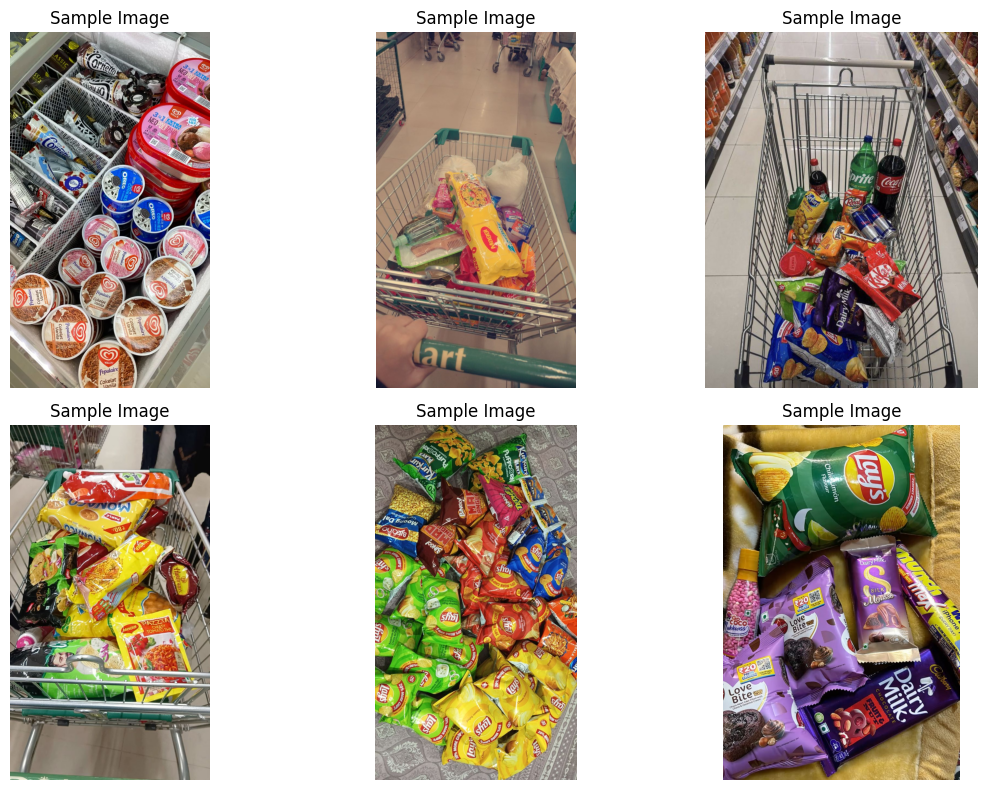

In [ ]:
import os
import random
from PIL import Image
import matplotlib.pyplot as plt

img_dir = "/content/drive/MyDrive/final_year_project/custom_od_project/extracted/dataset_yolo_remapped_7class_split/train/images"

images = random.sample(os.listdir(img_dir), 6)

plt.figure(figsize=(12,8))

for i, img_name in enumerate(images):
    img_path = os.path.join(img_dir, img_name)
    img = Image.open(img_path)

    plt.subplot(2,3,i+1)
    plt.imshow(img)
    plt.title("Sample Image")
    plt.axis("off")

plt.tight_layout()
plt.show()

<h3 style="text-align: center;">
Model Adaptation and Training on Custom Basket Dataset
</h3>

The objective of this stage is to adapt the baseline object detection model to real-world basket scenarios involving occlusion, overlap, and clutter.

Rather than training from scratch, transfer learning was applied using a previously trained model on retail datasets.

This allows:
- faster convergence
- better generalization
- reduced training time with limited custom data

Model: YOLOv8 (Nano variant)  
Pretrained Weights: Custom-trained model on ~3K filtered retail images  
Input Resolution: 640 × 640  
Framework: Ultralytics YOLO  

Training Strategy:
- fine-tuning on custom dataset
- lower learning rate to preserve learned features
- AdamW optimizer for stable convergence

### Training Pipeline Execution

The following steps represent the actual training pipeline used for adapting the model to custom basket data.

Instead of directly training on Google Drive (which can be slow), the dataset is first copied to the runtime environment to ensure faster I/O during training.

The pipeline includes:
- dataset extraction and verification
- class distribution analysis
- class remapping to reduce complexity
- dataset cleaning and restructuring
- final training-ready dataset creation

In [ ]:
# ------------------------------------------------------------
# Dataset preparation: move compressed dataset to runtime
# and extract locally to avoid slow disk reads from Drive
# ------------------------------------------------------------

# ============================================
# STEP 1: unzip dataset to runtime
# ============================================

import shutil
import zipfile
from pathlib import Path
import os

# -------- paths --------
ZIP_PATH = Path("/content/drive/MyDrive/final_year_project/custom_od_project/object_detection_grocery_dataset.yolov8 (1).zip")
RUNTIME_ZIP_PATH = Path("/content/object_detection_grocery_dataset.yolov8.zip")
EXTRACT_DIR = Path("/content/drive/MyDrive/final_year_project/custom_od_project/extracted/object_detection_grocery_dataset")

# -------- checks --------
print("Zip exists:", ZIP_PATH.exists())
if not ZIP_PATH.exists():
    raise FileNotFoundError(f"Dataset zip not found at: {ZIP_PATH}")

# -------- copy zip to runtime --------
shutil.copy2(ZIP_PATH, RUNTIME_ZIP_PATH)
print("Copied zip to runtime:", RUNTIME_ZIP_PATH)

# -------- clean old extract dir if exists --------
if EXTRACT_DIR.exists():
    shutil.rmtree(EXTRACT_DIR)

EXTRACT_DIR.mkdir(parents=True, exist_ok=True)

# -------- unzip --------
with zipfile.ZipFile(RUNTIME_ZIP_PATH, "r") as z:
    z.extractall(EXTRACT_DIR)

print("\nDataset extracted to:", EXTRACT_DIR)
print("\nTop-level contents:")
for p in EXTRACT_DIR.iterdir():
    print("-", p.name)

Zip exists: True
Copied zip to runtime: /content/object_detection_grocery_dataset.yolov8.zip

Dataset extracted to: /content/drive/MyDrive/final_year_project/custom_od_project/extracted/object_detection_grocery_dataset

Top-level contents:
- README.roboflow.txt
- data.yaml
- train


In [ ]:
# ------------------------------------------------------------
# Verify dataset integrity:
# - check data.yaml structure
# - confirm class names and splits
# - ensure images and labels are aligned
# ------------------------------------------------------------

# ============================================
# STEP 2: Verify dataset structure and classes
# ============================================
from pathlib import Path
import yaml
import os

DATASET_DIR = Path("/content/drive/MyDrive/final_year_project/custom_od_project/extracted/object_detection_grocery_dataset")
DATA_YAML = DATASET_DIR / "data.yaml"

print("data.yaml exists:", DATA_YAML.exists())
if not DATA_YAML.exists():
    raise FileNotFoundError(f"Missing data.yaml at {DATA_YAML}")

with open(DATA_YAML, "r") as f:
    data_cfg = yaml.safe_load(f)

print("\n==== RAW data.yaml ====")
print(data_cfg)

print("\n==== Class Info ====")
print("nc:", data_cfg.get("nc"))
print("names:", data_cfg.get("names"))

# -------- detect train/val/test paths --------
train_path = data_cfg.get("train")
val_path   = data_cfg.get("val")
test_path  = data_cfg.get("test")

print("\n==== Split Paths from YAML ====")
print("train:", train_path)
print("val  :", val_path)
print("test :", test_path)

# -------- helper to count files --------
IMG_EXTS = {".jpg", ".jpeg", ".png", ".webp"}

def count_split(split_name):
    img_dir = DATASET_DIR / split_name / "images"
    lbl_dir = DATASET_DIR / split_name / "labels"

    print(f"\n--- {split_name.upper()} ---")
    print("images dir exists:", img_dir.exists(), img_dir)
    print("labels dir exists:", lbl_dir.exists(), lbl_dir)

    if img_dir.exists():
        img_count = len([p for p in img_dir.iterdir() if p.suffix.lower() in IMG_EXTS])
        print("image count:", img_count)
    else:
        img_count = 0

    if lbl_dir.exists():
        lbl_count = len(list(lbl_dir.glob("*.txt")))
        print("label count:", lbl_count)
    else:
        lbl_count = 0

    return img_count, lbl_count

# -------- check common YOLO structure --------
train_counts = count_split("train")

# Roboflow may use valid instead of val
if (DATASET_DIR / "valid").exists():
    valid_counts = count_split("valid")
else:
    valid_counts = count_split("val")

if (DATASET_DIR / "test").exists():
    test_counts = count_split("test")
else:
    print("\n--- TEST ---")
    print("No test folder found")

# -------- preview first few class names cleanly --------
names = data_cfg.get("names", [])
print("\n==== Indexed Class Names ====")
if isinstance(names, list):
    for i, n in enumerate(names):
        print(f"{i}: {n}")
elif isinstance(names, dict):
    for k, v in names.items():
        print(f"{k}: {v}")

data.yaml exists: True

==== RAW data.yaml ====
{'train': '../train/images', 'val': '../valid/images', 'test': '../test/images', 'nc': 22, 'names': ['bakery_products', 'bread_refined', 'carbonated_drink', 'cereals_grains', 'chips_snacks', 'chocolate_confectionery', 'dairy', 'dairy_products', 'icecream_frozen_desserts', 'instant_processed_foods', 'juice', 'milk_drink', 'misc_food', 'non_food_item', 'noodles_instant', 'salty_snacks_fried', 'sauces_spreads', 'spreads_sugary_fatty', 'staples_cereals', 'sugary_drinks', 'sweet_biscuits_bakery', 'water'], 'roboflow': {'workspace': 'rakeshs-workspace-actqh', 'project': 'rakeshs-workspace-actqh', 'version': 'dataset', 'license': 'Private', 'url': 'https://app.roboflow.com/rakeshs-workspace-actqh/rakeshs-workspace-actqh/dataset'}}

==== Class Info ====
nc: 22
names: ['bakery_products', 'bread_refined', 'carbonated_drink', 'cereals_grains', 'chips_snacks', 'chocolate_confectionery', 'dairy', 'dairy_products', 'icecream_frozen_desserts', 'instant_

In [ ]:
# ------------------------------------------------------------
# Analyze class distribution:
# Helps identify imbalance and noisy classes
# Used to guide remapping and filtering decisions
# ------------------------------------------------------------

# ============================================
# STEP 4: Count current dataset objects per class
# ============================================
from pathlib import Path
from collections import Counter
import yaml

DATASET_DIR = Path("/content/object_detection_grocery_dataset")
TRAIN_LBL_DIR = DATASET_DIR / "train" / "labels"
DATA_YAML = DATASET_DIR / "data.yaml"

with open(DATA_YAML, "r") as f:
    data_cfg = yaml.safe_load(f)

yaml_names = data_cfg["names"]
class_counts = Counter()
image_presence_counts = Counter()

label_files = list(TRAIN_LBL_DIR.glob("*.txt"))
print("Total label files:", len(label_files))

for lbl_file in label_files:
    present_in_image = set()
    with open(lbl_file, "r") as f:
        for line in f:
            parts = line.strip().split()
            if len(parts) < 5:
                continue
            cls_id = int(float(parts[0]))
            class_counts[cls_id] += 1
            present_in_image.add(cls_id)
    for cls_id in present_in_image:
        image_presence_counts[cls_id] += 1

print("\n=== Object count per class ===")
for i, name in enumerate(yaml_names):
    print(f"{i}: {name:30s} objects={class_counts[i]:4d} | images={image_presence_counts[i]:3d}")

Total label files: 198

=== Object count per class ===
0: bakery_products                objects=  56 | images= 19
1: bread_refined                  objects=   1 | images=  1
2: carbonated_drink               objects=  14 | images=  9
3: cereals_grains                 objects=   3 | images=  2
4: chips_snacks                   objects= 103 | images= 31
5: chocolate_confectionery        objects= 339 | images= 78
6: dairy                          objects=   8 | images=  7
7: dairy_products                 objects=   6 | images=  4
8: icecream_frozen_desserts       objects= 168 | images= 26
9: instant_processed_foods        objects=  93 | images= 42
10: juice                          objects=   5 | images=  4
11: milk_drink                     objects=   3 | images=  3
12: misc_food                      objects=   3 | images=  3
13: non_food_item                  objects=  13 | images= 10
14: noodles_instant                objects=  19 | images= 13
15: salty_snacks_fried             objec

### Class Remapping Strategy

The original dataset contained 22 classes, including:
- redundant categories
- non-food items
- overly granular product distinctions

To improve model generalization and align with downstream health scoring, classes were consolidated into fewer meaningful groups.

Key decisions:
- merged similar categories (e.g., chips + snacks → salty_snacks_fried)
- grouped beverages under sugary_drinks where applicable
- removed non-relevant classes (e.g., non_food_item, misc_food)

This significantly reduced noise and improved training stability.

### Filtering Strategy

Certain classes were explicitly removed:
- non_food_item → not relevant for health scoring
- misc_food → ambiguous category
- water → handled separately in recommendation logic

This ensured the model focuses only on actionable food categories.

In [ ]:
# ------------------------------------------------------------
# Class consolidation strategy:
# Original dataset contains fine-grained and noisy classes.
# These are mapped into fewer, semantically meaningful categories
# aligned with nutrition and recommendation objectives.
# ------------------------------------------------------------

import os
import shutil
from pathlib import Path
from collections import defaultdict
import yaml

# =========================================================
# 1) PATHS — EDIT THESE
# =========================================================

SRC_DATASET = "/content/drive/MyDrive/final_year_project/custom_od_project/extracted/object_detection_grocery_dataset"
OUT_DATASET = "/content/drive/MyDrive/final_year_project/custom_od_project/extracted/dataset_yolo_remapped_9class"
# Expected YOLO structure:
# SRC_DATASET/
#   train/images, train/labels
#   valid/images, valid/labels
#   test/images,  test/labels   (optional)

# =========================================================
# 2) ORIGINAL CLASS NAMES
#    Must match your current dataset exactly by index
# =========================================================
old_names = {
    0: "bakery_products",
    1: "bread_refined",
    2: "carbonated_drink",
    3: "cereals_grains",
    4: "chips_snacks",
    5: "chocolate_confectionery",
    6: "dairy",
    7: "dairy_products",
    8: "icecream_frozen_desserts",
    9: "instant_processed_foods",
    10: "juice",
    11: "milk_drink",
    12: "misc_food",
    13: "non_food_item",
    14: "noodles_instant",
    15: "salty_snacks_fried",
    16: "sauces_spreads",
    17: "spreads_sugary_fatty",
    18: "staples_cereals",
    19: "sugary_drinks",
    20: "sweet_biscuits_bakery",
    21: "water",
}

# =========================================================
# 3) FINAL CLASS NAMES
# =========================================================
new_names = {
    0: "salty_snacks_fried",
    1: "sweet_biscuits_bakery",
    2: "instant_processed_foods",
    3: "sugary_drinks",
    4: "chocolate_confectionery",
    5: "icecream_frozen_desserts",
    6: "spreads_sugary_fatty",
    7: "staples_cereals",
    8: "dairy_products",
}

# Reverse lookup for new class name -> new id
new_name_to_id = {v: k for k, v in new_names.items()}

# =========================================================
# 4) FINAL REMAPPING
#    Unmapped classes will be DROPPED
# =========================================================
remap_by_name = {
    "bakery_products": "sweet_biscuits_bakery",
    "carbonated_drink": "sugary_drinks",
    "cereals_grains": "staples_cereals",
    "chips_snacks": "salty_snacks_fried",
    "chocolate_confectionery": "chocolate_confectionery",
    "dairy": "dairy_products",
    "dairy_products": "dairy_products",
    "icecream_frozen_desserts": "icecream_frozen_desserts",
    "instant_processed_foods": "instant_processed_foods",
    "juice": "sugary_drinks",
    "milk_drink": "sugary_drinks",
    "noodles_instant": "instant_processed_foods",
    "salty_snacks_fried": "salty_snacks_fried",
    "sauces_spreads": "spreads_sugary_fatty",
    "spreads_sugary_fatty": "spreads_sugary_fatty",
    "staples_cereals": "staples_cereals",
    "sugary_drinks": "sugary_drinks",
    "sweet_biscuits_bakery": "sweet_biscuits_bakery",
}

drop_classes = {
    "bread_refined",
    "misc_food",
    "non_food_item",
    "water",
}

# Build old_id -> new_id
old_id_to_new_id = {}
dropped_old_ids = set()

for old_id, old_name in old_names.items():
    if old_name in remap_by_name:
        final_name = remap_by_name[old_name]
        old_id_to_new_id[old_id] = new_name_to_id[final_name]
    else:
        dropped_old_ids.add(old_id)

# Safety check
for old_id, old_name in old_names.items():
    if old_name in drop_classes:
        dropped_old_ids.add(old_id)

print("Old ID -> New ID mapping:")
for k in sorted(old_id_to_new_id):
    print(f"{k:2d} ({old_names[k]}) -> {old_id_to_new_id[k]} ({new_names[old_id_to_new_id[k]]})")

print("\nDropped classes:")
for old_id in sorted(dropped_old_ids):
    print(f"{old_id:2d} ({old_names[old_id]})")

# =========================================================
# 5) HELPERS
# =========================================================
img_exts = [".jpg", ".jpeg", ".png", ".bmp", ".webp"]

def find_image_for_label(label_path: Path, images_dir: Path):
    stem = label_path.stem
    for ext in img_exts:
        img_path = images_dir / f"{stem}{ext}"
        if img_path.exists():
            return img_path
    return None

def remap_label_file(src_label_path: Path, dst_label_path: Path):
    """
    Returns:
      kept_count, dropped_count, new_class_ids_in_file
    """
    kept_lines = []
    kept_count = 0
    dropped_count = 0
    class_ids_in_file = []

    with open(src_label_path, "r") as f:
        lines = [line.strip() for line in f.readlines() if line.strip()]

    for line in lines:
        parts = line.split()
        if len(parts) < 5:
            # bad line, skip
            dropped_count += 1
            continue

        try:
            old_cls = int(parts[0])
        except ValueError:
            dropped_count += 1
            continue

        if old_cls in old_id_to_new_id:
            new_cls = old_id_to_new_id[old_cls]
            new_line = " ".join([str(new_cls)] + parts[1:])
            kept_lines.append(new_line)
            kept_count += 1
            class_ids_in_file.append(new_cls)
        else:
            dropped_count += 1

    if kept_lines:
        dst_label_path.parent.mkdir(parents=True, exist_ok=True)
        with open(dst_label_path, "w") as f:
            f.write("\n".join(kept_lines) + "\n")

    return kept_count, dropped_count, class_ids_in_file

# =========================================================
# 6) CLEAN OUTPUT FOLDER
# =========================================================
out_path = Path(OUT_DATASET)
if out_path.exists():
    print(f"\nRemoving existing output folder: {out_path}")
    shutil.rmtree(out_path)

# =========================================================
# 7) PROCESS SPLITS
# =========================================================
splits = ["train", "valid", "test"]

overall_stats = {
    "images_kept": 0,
    "images_dropped": 0,
    "labels_kept": 0,
    "labels_dropped": 0,
}

per_class_objects = defaultdict(int)
per_class_images = defaultdict(set)

for split in splits:
    src_images = Path(SRC_DATASET) / split / "images"
    src_labels = Path(SRC_DATASET) / split / "labels"

    if not src_images.exists() or not src_labels.exists():
        print(f"\nSkipping split '{split}' (missing images/labels folder)")
        continue

    dst_images = out_path / split / "images"
    dst_labels = out_path / split / "labels"
    dst_images.mkdir(parents=True, exist_ok=True)
    dst_labels.mkdir(parents=True, exist_ok=True)

    label_files = sorted(src_labels.glob("*.txt"))
    print(f"\nProcessing split: {split} | label files: {len(label_files)}")

    split_kept = 0
    split_dropped = 0

    for src_label in label_files:
        dst_label = dst_labels / src_label.name

        kept_count, dropped_count, class_ids_in_file = remap_label_file(src_label, dst_label)

        overall_stats["labels_kept"] += kept_count
        overall_stats["labels_dropped"] += dropped_count

        src_img = find_image_for_label(src_label, src_images)

        # If no valid labels remain, drop the image+label
        if kept_count == 0:
            split_dropped += 1
            overall_stats["images_dropped"] += 1
            if dst_label.exists():
                dst_label.unlink()
            continue

        if src_img is None:
            print(f"Warning: image not found for label {src_label.name}")
            if dst_label.exists():
                dst_label.unlink()
            split_dropped += 1
            overall_stats["images_dropped"] += 1
            continue

        shutil.copy2(src_img, dst_images / src_img.name)
        split_kept += 1
        overall_stats["images_kept"] += 1

        stem = src_label.stem
        for cid in class_ids_in_file:
            per_class_objects[cid] += 1
            per_class_images[cid].add(f"{split}/{stem}")

    print(f"Kept images in {split}: {split_kept}")
    print(f"Dropped images in {split}: {split_dropped}")

# =========================================================
# 8) WRITE data.yaml
# =========================================================
yaml_data = {
    "train": str((out_path / "train" / "images").resolve()),
    "val": str((out_path / "valid" / "images").resolve()),
    "test": str((out_path / "test" / "images").resolve()) if (out_path / "test" / "images").exists() else "",
    "nc": len(new_names),
    "names": [new_names[i] for i in range(len(new_names))],
}

yaml_path = out_path / "data.yaml"
with open(yaml_path, "w") as f:
    yaml.safe_dump(yaml_data, f, sort_keys=False)

# =========================================================
# 9) SUMMARY
# =========================================================
print("\n" + "=" * 60)
print("FINAL SUMMARY")
print("=" * 60)
print(f"Output dataset: {out_path}")
print(f"Images kept   : {overall_stats['images_kept']}")
print(f"Images dropped: {overall_stats['images_dropped']}")
print(f"Labels kept   : {overall_stats['labels_kept']}")
print(f"Labels dropped: {overall_stats['labels_dropped']}")
print(f"data.yaml     : {yaml_path}")

print("\nPer-class distribution after remap:")
for cid in range(len(new_names)):
    print(
        f"{cid}: {new_names[cid]:28s} "
        f"objects={per_class_objects[cid]:4d} | "
        f"images={len(per_class_images[cid]):4d}"
    )

Old ID -> New ID mapping:
 0 (bakery_products) -> 1 (sweet_biscuits_bakery)
 2 (carbonated_drink) -> 3 (sugary_drinks)
 3 (cereals_grains) -> 7 (staples_cereals)
 4 (chips_snacks) -> 0 (salty_snacks_fried)
 5 (chocolate_confectionery) -> 4 (chocolate_confectionery)
 6 (dairy) -> 8 (dairy_products)
 7 (dairy_products) -> 8 (dairy_products)
 8 (icecream_frozen_desserts) -> 5 (icecream_frozen_desserts)
 9 (instant_processed_foods) -> 2 (instant_processed_foods)
10 (juice) -> 3 (sugary_drinks)
11 (milk_drink) -> 3 (sugary_drinks)
14 (noodles_instant) -> 2 (instant_processed_foods)
15 (salty_snacks_fried) -> 0 (salty_snacks_fried)
16 (sauces_spreads) -> 6 (spreads_sugary_fatty)
17 (spreads_sugary_fatty) -> 6 (spreads_sugary_fatty)
18 (staples_cereals) -> 7 (staples_cereals)
19 (sugary_drinks) -> 3 (sugary_drinks)
20 (sweet_biscuits_bakery) -> 1 (sweet_biscuits_bakery)

Dropped classes:
 1 (bread_refined)
12 (misc_food)
13 (non_food_item)
21 (water)

Processing split: train | label files: 19

### Observations After Remapping

- Significant reduction in noisy and irrelevant classes
- Improved balance across key food categories
- Removal of non-actionable classes enhanced training focus

This step played a crucial role in stabilizing model learning before fine-tuning.


“We didn’t directly train the model. First, we analyzed class distribution, removed noise, and remapped classes into meaningful categories aligned with nutrition. This preprocessing step significantly improved model performance.”

In [ ]:
# ------------------------------------------------------------
# Final dataset generation:
# - remap labels
# - drop irrelevant annotations
# - rebuild YOLO structure
# - ensure only valid images are retained
# ------------------------------------------------------------

import os
import shutil
import random
from pathlib import Path
import yaml

# =========================================================
# 1) PATHS
# =========================================================
SRC_DATASET = "/content/drive/MyDrive/final_year_project/custom_od_project/extracted/dataset_yolo_remapped_9class"
OUT_DATASET = "/content/drive/MyDrive/final_year_project/custom_od_project/extracted/dataset_yolo_remapped_9class_split"

TRAIN_RATIO = 0.8
SEED = 42

random.seed(SEED)

# =========================================================
# 2) PATH OBJECTS
# =========================================================
src_path = Path(SRC_DATASET)
out_path = Path(OUT_DATASET)

src_images = src_path / "train" / "images"
src_labels = src_path / "train" / "labels"

assert src_images.exists(), f"Missing: {src_images}"
assert src_labels.exists(), f"Missing: {src_labels}"

# =========================================================
# 3) CLEAN OUTPUT
# =========================================================
if out_path.exists():
    shutil.rmtree(out_path)

(out_path / "train" / "images").mkdir(parents=True, exist_ok=True)
(out_path / "train" / "labels").mkdir(parents=True, exist_ok=True)
(out_path / "valid" / "images").mkdir(parents=True, exist_ok=True)
(out_path / "valid" / "labels").mkdir(parents=True, exist_ok=True)

# =========================================================
# 4) COLLECT FILES
# =========================================================
img_exts = [".jpg", ".jpeg", ".png", ".bmp", ".webp"]

def find_image_for_label(label_path: Path, images_dir: Path):
    for ext in img_exts:
        p = images_dir / f"{label_path.stem}{ext}"
        if p.exists():
            return p
    return None

label_files = sorted(src_labels.glob("*.txt"))
pairs = []

for lbl in label_files:
    img = find_image_for_label(lbl, src_images)
    if img is not None:
        pairs.append((img, lbl))

print(f"Total paired samples: {len(pairs)}")

# =========================================================
# 5) SHUFFLE + SPLIT
# =========================================================
random.shuffle(pairs)

n_total = len(pairs)
n_train = int(n_total * TRAIN_RATIO)
train_pairs = pairs[:n_train]
valid_pairs = pairs[n_train:]

print(f"Train samples: {len(train_pairs)}")
print(f"Valid samples: {len(valid_pairs)}")

# =========================================================
# 6) COPY FILES
# =========================================================
def copy_pairs(pairs_list, split_name):
    for img_path, lbl_path in pairs_list:
        shutil.copy2(img_path, out_path / split_name / "images" / img_path.name)
        shutil.copy2(lbl_path, out_path / split_name / "labels" / lbl_path.name)

copy_pairs(train_pairs, "train")
copy_pairs(valid_pairs, "valid")

# =========================================================
# 7) CLASS NAMES
# =========================================================
names = [
    "salty_snacks_fried",
    "sweet_biscuits_bakery",
    "instant_processed_foods",
    "sugary_drinks",
    "chocolate_confectionery",
    "icecream_frozen_desserts",
    "spreads_sugary_fatty",
    "staples_cereals",
    "dairy_products",
]

# =========================================================
# 8) WRITE data.yaml
# =========================================================
yaml_data = {
    "train": str((out_path / "train" / "images").resolve()),
    "val": str((out_path / "valid" / "images").resolve()),
    "nc": len(names),
    "names": names,
}

yaml_path = out_path / "data.yaml"
with open(yaml_path, "w") as f:
    yaml.safe_dump(yaml_data, f, sort_keys=False)

print(f"\nCreated split dataset at: {out_path}")
print(f"Created yaml at: {yaml_path}")

Total paired samples: 198
Train samples: 158
Valid samples: 40

Created split dataset at: /content/drive/MyDrive/final_year_project/custom_od_project/extracted/dataset_yolo_remapped_9class_split
Created yaml at: /content/drive/MyDrive/final_year_project/custom_od_project/extracted/dataset_yolo_remapped_9class_split/data.yaml


In [ ]:
from pathlib import Path
from collections import defaultdict

DATASET = "/content/drive/MyDrive/final_year_project/custom_od_project/extracted/dataset_yolo_remapped_9class_split"

names = [
    "salty_snacks_fried",
    "sweet_biscuits_bakery",
    "instant_processed_foods",
    "sugary_drinks",
    "chocolate_confectionery",
    "icecream_frozen_desserts",
    "spreads_sugary_fatty",
    "staples_cereals",
    "dairy_products",
]

def count_split(split):
    labels_dir = Path(DATASET) / split / "labels"
    obj_counts = defaultdict(int)
    img_counts = defaultdict(set)

    for txt in labels_dir.glob("*.txt"):
        with open(txt, "r") as f:
            lines = [x.strip() for x in f if x.strip()]
        for line in lines:
            cls = int(line.split()[0])
            obj_counts[cls] += 1
            img_counts[cls].add(txt.stem)

    print(f"\n=== {split.upper()} ===")
    for i, name in enumerate(names):
        print(f"{i}: {name:28s} objects={obj_counts[i]:4d} | images={len(img_counts[i]):4d}")

count_split("train")
count_split("valid")


=== TRAIN ===
0: salty_snacks_fried           objects= 357 | images=  96
1: sweet_biscuits_bakery        objects= 257 | images=  65
2: instant_processed_foods      objects=  74 | images=  36
3: sugary_drinks                objects= 175 | images=  50
4: chocolate_confectionery      objects= 273 | images=  64
5: icecream_frozen_desserts     objects= 113 | images=  19
6: spreads_sugary_fatty         objects=  21 | images=  15
7: staples_cereals              objects=  82 | images=  20
8: dairy_products               objects=  11 | images=   8

=== VALID ===
0: salty_snacks_fried           objects=  95 | images=  26
1: sweet_biscuits_bakery        objects=  60 | images=  19
2: instant_processed_foods      objects=  38 | images=  14
3: sugary_drinks                objects=  43 | images=  10
4: chocolate_confectionery      objects=  66 | images=  14
5: icecream_frozen_desserts     objects=  55 | images=   7
6: spreads_sugary_fatty         objects=   4 | images=   1
7: staples_cereals        

In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 54.1 MB/s eta 0:00:00


In [ ]:
from ultralytics import YOLO

model = YOLO("/content/drive/MyDrive/final_year_project/final_runs/grocery_final_clean_v3/weights/best.pt")


model.train(
    data="/content/drive/MyDrive/final_year_project/custom_od_project/extracted/dataset_yolo_remapped_9class_split/data.yaml",
    epochs=50,
    imgsz=640,
    batch=8,
    device=0,
    optimizer="AdamW",
    lr0=0.001,
    patience=20,
    name="final_remapped_9class_split",
    project="/content/drive/MyDrive/final_year_project/custom_od_project/final_runs"  # ✅ THIS LINE IS KEY
)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics 8.4.27 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/final_year_project/custom_od_project/extracted/dataset_yolo_remapped_9class_split/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fracti

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5, 6, 7, 8])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x79ea7026b8f0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.0470

In [ ]:
import os
import shutil
from pathlib import Path

# ================================
# PATHS
# ================================
SRC = "/content/drive/MyDrive/final_year_project/custom_od_project/extracted/dataset_yolo_remapped_9class_split"
DST = "/content/drive/MyDrive/final_year_project/custom_od_project/extracted/dataset_yolo_remapped_7class_split"

# Remove old output if exists
if os.path.exists(DST):
    shutil.rmtree(DST)

# Create folders
for split in ["train", "valid"]:
    os.makedirs(f"{DST}/{split}/images", exist_ok=True)
    os.makedirs(f"{DST}/{split}/labels", exist_ok=True)

# ================================
# CLASS REMAP (9 → 7)
# ================================
# Remove 6 and 8
remap = {
    0: 0,  # salty_snacks_fried
    1: 1,  # sweet_biscuits_bakery
    2: 2,  # instant_processed_foods
    3: 3,  # sugary_drinks
    4: 4,  # chocolate_confectionery
    5: 5,  # icecream_frozen_desserts
    7: 6   # staples_cereals
}

img_exts = [".jpg", ".jpeg", ".png", ".bmp", ".webp"]

def find_img(label_path, img_dir):
    for ext in img_exts:
        p = os.path.join(img_dir, label_path.stem + ext)
        if os.path.exists(p):
            return p
    return None

# ================================
# PROCESS
# ================================
for split in ["train", "valid"]:
    label_dir = Path(f"{SRC}/{split}/labels")
    img_dir = Path(f"{SRC}/{split}/images")

    for label_file in label_dir.glob("*.txt"):
        with open(label_file, "r") as f:
            lines = [x.strip() for x in f if x.strip()]

        new_lines = []

        for line in lines:
            parts = line.split()
            cls = int(parts[0])

            if cls in remap:
                new_cls = remap[cls]
                new_lines.append(" ".join([str(new_cls)] + parts[1:]))

        # Skip if no valid labels
        if len(new_lines) == 0:
            continue

        # Write new label
        dst_label = Path(f"{DST}/{split}/labels/{label_file.name}")
        with open(dst_label, "w") as f:
            f.write("\n".join(new_lines) + "\n")

        # Copy image
        img_path = find_img(label_file, img_dir)
        if img_path:
            shutil.copy2(img_path, f"{DST}/{split}/images/{Path(img_path).name}")

print("✅ 7-class dataset created successfully")

✅ 7-class dataset created successfully


In [ ]:
import yaml

yaml_data = {
    "train": f"{DST}/train/images",
    "val": f"{DST}/valid/images",
    "nc": 7,
    "names": [
        "salty_snacks_fried",
        "sweet_biscuits_bakery",
        "instant_processed_foods",
        "sugary_drinks",
        "chocolate_confectionery",
        "icecream_frozen_desserts",
        "staples_cereals"
    ]
}

with open(f"{DST}/data.yaml", "w") as f:
    yaml.dump(yaml_data, f)

print("✅ data.yaml created")

✅ data.yaml created


In [ ]:
from ultralytics import YOLO

model = YOLO("/content/drive/MyDrive/final_year_project/final_runs/grocery_final_clean_v3/weights/best.pt")

model.train(
    data="/content/drive/MyDrive/final_year_project/custom_od_project/extracted/dataset_yolo_remapped_7class_split/data.yaml",
    epochs=100,
    imgsz=640,
    batch=8,
    device=0,
    optimizer="AdamW",
    lr0=0.0005,
    patience=25,
    weight_decay=0.0005,
    workers=2,
    project="/content/drive/MyDrive/final_year_project/custom_od_project/final_runs",
    name="final_remapped_7class_e100"
)

New https://pypi.org/project/ultralytics/8.4.28 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.4.27 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/final_year_project/custom_od_project/extracted/dataset_yolo_remapped_7class_split/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.0005, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=trai

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5, 6])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x79ea702239e0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
  

In [ ]:
from ultralytics import YOLO

MODEL_PATH = "/content/drive/MyDrive/final_year_project/custom_od_project/final_runs/final_remapped_7class_e1002/weights/best.pt"
SOURCE = "/content/drive/MyDrive/final_year_project/custom_od_project/extracted/dataset_yolo_remapped_7class_split/valid/images"

model = YOLO(MODEL_PATH)

results = model.predict(
    source=SOURCE,
    imgsz=640,
    conf=0.25,
    iou=0.45,
    save=True,
    save_txt=True,
    save_conf=True,
    project="/content/drive/MyDrive/final_year_project/custom_od_project/predictions",
    name="final_7class_valid_preds",
    exist_ok=True
)

print("Done")


image 1/40 /content/drive/MyDrive/final_year_project/custom_od_project/extracted/dataset_yolo_remapped_7class_split/valid/images/010ead073f89ad20bebab3bbd999feab_jpg.rf.pwC59f0YcpMBxOmUjHVp.jpg: 640x384 15 chocolate_confectionerys, 180.8ms
image 2/40 /content/drive/MyDrive/final_year_project/custom_od_project/extracted/dataset_yolo_remapped_7class_split/valid/images/07abab614ea36b473e6c6e4e836430c2_jpg.rf.7enOqWrBhMEA3BO3hmRe.jpg: 640x384 2 salty_snacks_frieds, 2 instant_processed_foodss, 63.1ms
image 3/40 /content/drive/MyDrive/final_year_project/custom_od_project/extracted/dataset_yolo_remapped_7class_split/valid/images/07ea07bfb5acde507927389b98744af3_jpg.rf.Kq3MulCjdz6DGrs5FFmX.jpg: 640x480 2 instant_processed_foodss, 167.3ms
image 4/40 /content/drive/MyDrive/final_year_project/custom_od_project/extracted/dataset_yolo_remapped_7class_split/valid/images/0b6881b3f83a91db193191d8ebce929b_jpg.rf.tXg9kO4pRZi8UGyoGfy5.jpg: 640x384 17 staples_cerealss, 7.3ms
image 5/40 /content/drive/MyD

### Custom Dataset Training – Performance Interpretation

The model was fine-tuned on the custom basket dataset for 50 epochs to evaluate its ability to handle real-world conditions such as occlusion and overlapping objects.

#### Overall Performance

- Precision: 0.53  
- Recall: 0.39  
- mAP@0.5: 0.33  
- mAP@0.5:0.95: 0.23  

These results indicate moderate detection performance under challenging visual conditions.

---

#### Class-wise Observations

- **salty_snacks_fried**
  - Strong performance (mAP@0.5 ≈ 0.61)
  - High recall due to frequent occurrence in dataset
  - Model is able to detect multiple overlapping snack packets effectively

- **sugary_drinks**
  - Good performance (mAP@0.5 ≈ 0.52)
  - Distinct visual features (bottles/cans) improve detection reliability

- **staples_cereals**
  - Stable detection (mAP@0.5 ≈ 0.53)
  - Larger packaging size helps visibility even in clutter

- **chocolate_confectionery**
  - Moderate performance (mAP@0.5 ≈ 0.41)
  - Confusion observed with similar packaged items

- **instant_processed_foods**
  - Moderate performance (mAP@0.5 ≈ 0.27)
  - Variation in packaging reduces consistency

- **sweet_biscuits_bakery**
  - Lower performance (mAP@0.5 ≈ 0.22)
  - High intra-class similarity leads to misclassification

- **icecream_frozen_desserts**
  - Moderate detection but lower recall
  - Likely impacted by smaller dataset size

- **spreads_sugary_fatty / dairy_products**
  - Poor performance due to extremely low sample count
  - Insufficient data for model generalization

---

#### Key Insights

- The model performs well on **frequent and visually distinct categories**
- Performance drops for:
  - low-frequency classes
  - visually similar packaging
  - heavily occluded items

- Recall is lower than precision:
  → indicates missed detections in cluttered scenes

---

#### Interpretation in Context of Problem

Unlike standard object detection tasks, basket-level detection involves:
- multiple objects per frame
- partial visibility
- overlapping bounding boxes

Given this complexity, the achieved performance is considered acceptable for downstream tasks such as:
- SKU mapping
- health scoring
- recommendation generation

---

#### Design Implication

The limitations observed at detection level reinforce the need for:
- SKU-level mapping for refinement
- rule-based health scoring
- recommendation logic independent of perfect detection

This justifies the multi-stage pipeline design adopted in this work.

Total images: 40


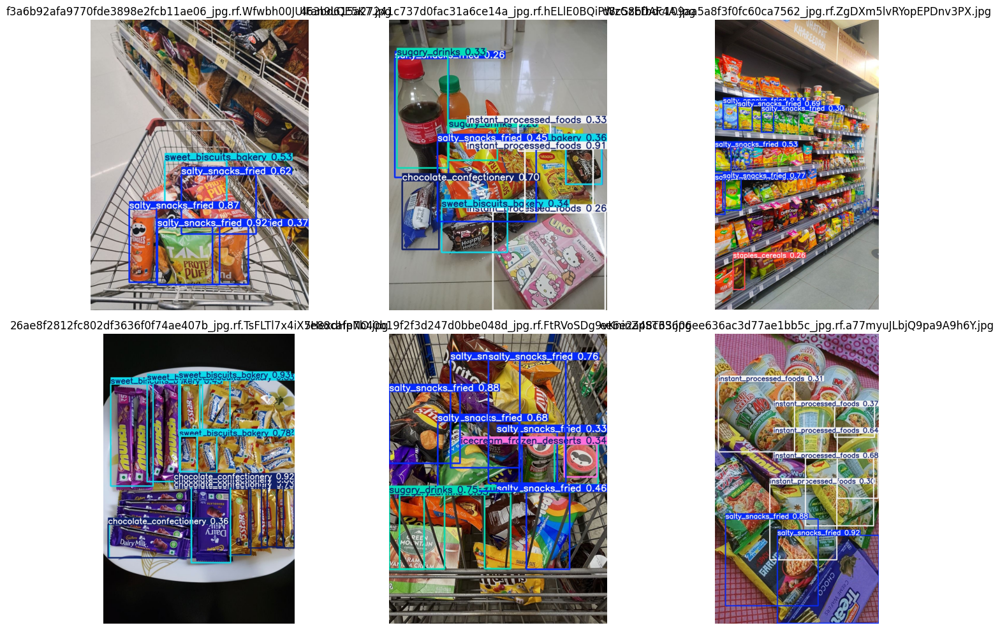

In [ ]:
import os
import random
from PIL import Image
import matplotlib.pyplot as plt

# Path where predictions are saved
pred_dir = "/content/drive/MyDrive/final_year_project/custom_od_project/predictions/final_7class_valid_preds"

# Get image files
imgs = [f for f in os.listdir(pred_dir) if f.lower().endswith((".jpg", ".jpeg", ".png"))]

print("Total images:", len(imgs))

# Pick random samples
sample_imgs = random.sample(imgs, min(6, len(imgs)))

# Plot
plt.figure(figsize=(15, 10))
for i, img_name in enumerate(sample_imgs, 1):
    img_path = os.path.join(pred_dir, img_name)
    img = Image.open(img_path)

    plt.subplot(2, 3, i)
    plt.imshow(img)
    plt.title(img_name)
    plt.axis("off")

plt.tight_layout()
plt.show()

“The model performs well for dominant categories like snacks and drinks, but struggles with low-data classes and overlapping items. This is expected in basket scenarios, and that’s why we designed a multi-stage pipeline where detection is followed by SKU mapping and recommendation.”

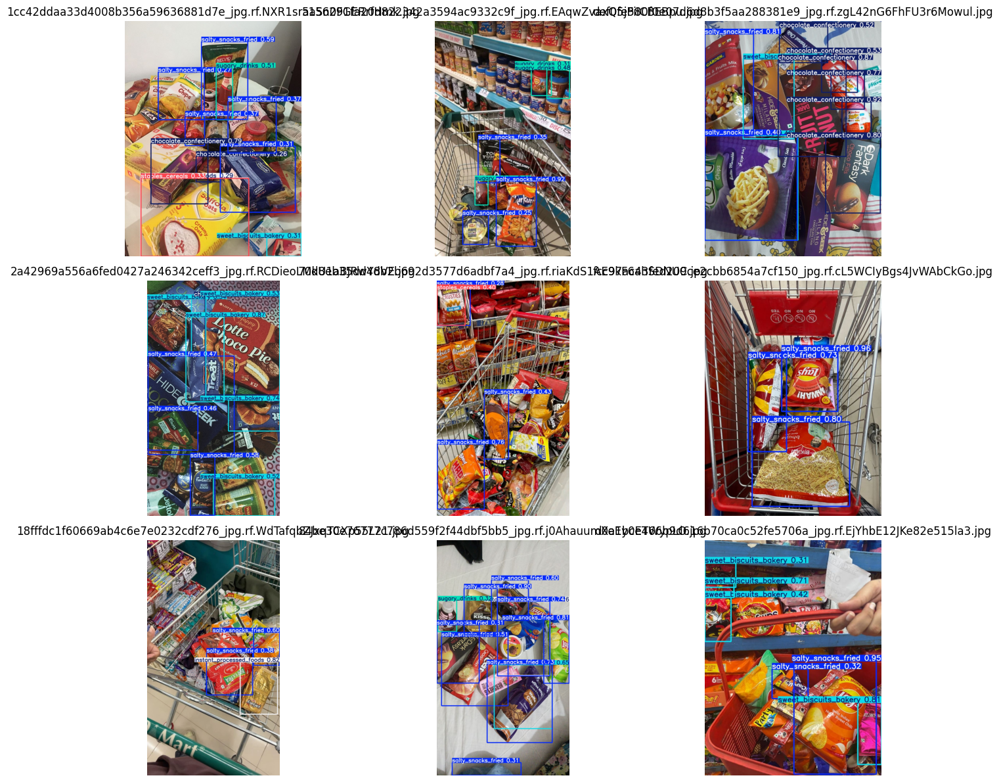

In [ ]:
n = 9  # change number of images

sample_imgs = random.sample(imgs, min(n, len(imgs)))

rows = 3
cols = (len(sample_imgs) + 2) // 3

plt.figure(figsize=(15, 12))

for i, img_name in enumerate(sample_imgs, 1):
    img_path = os.path.join(pred_dir, img_name)
    img = Image.open(img_path)

    plt.subplot(rows, cols, i)
    plt.imshow(img)
    plt.title(img_name)
    plt.axis("off")

plt.tight_layout()
plt.show()

In [ ]:
from ultralytics import YOLO
import cv2
import numpy as np

model = YOLO("/content/drive/MyDrive/final_year_project/custom_od_project/final_runs/final_remapped_7class_e1002/weights/best.pt")

img_path = "/content/drive/MyDrive/final_year_project/custom_od_project/predictions/final_7class_valid_preds/010ead073f89ad20bebab3bbd999feab_jpg.rf.pwC59f0YcpMBxOmUjHVp.jpg"
results = model.predict(img_path, conf=0.25, iou=0.45, save=False)

r = results[0]
boxes = r.boxes.xyxy.cpu().numpy() if r.boxes is not None else np.array([])
confs = r.boxes.conf.cpu().numpy() if r.boxes is not None else np.array([])

def iou(box1, box2):
    x1 = max(box1[0], box2[0])
    y1 = max(box1[1], box2[1])
    x2 = min(box1[2], box2[2])
    y2 = min(box1[3], box2[3])

    inter = max(0, x2 - x1) * max(0, y2 - y1)
    a1 = (box1[2]-box1[0]) * (box1[3]-box1[1])
    a2 = (box2[2]-box2[0]) * (box2[3]-box2[1])
    union = a1 + a2 - inter
    return inter / union if union > 0 else 0

overlap_pairs = 0
for i in range(len(boxes)):
    for j in range(i + 1, len(boxes)):
        if iou(boxes[i], boxes[j]) > 0.3:
            overlap_pairs += 1

avg_conf = float(np.mean(confs)) if len(confs) else 0.0
num_boxes = len(boxes)

clutter_flag = (
    overlap_pairs >= 2 or
    avg_conf < 0.45 or
    num_boxes >= 8
)

print("Detections:", num_boxes)
print("Average confidence:", round(avg_conf, 3))
print("Overlap pairs:", overlap_pairs)
print("Clutter detected:", clutter_flag)

if clutter_flag:
    print("Alert: Spread items for better detection.")
    print("Optional next step: run MobileSAM on overlapping regions.")
else:
    print("Scene is clear enough for direct SKU mapping and scoring.")


image 1/1 /content/drive/MyDrive/final_year_project/custom_od_project/predictions/final_7class_valid_preds/010ead073f89ad20bebab3bbd999feab_jpg.rf.pwC59f0YcpMBxOmUjHVp.jpg: 640x384 1 sweet_biscuits_bakery, 6 chocolate_confectionerys, 18.4ms
Speed: 4.2ms preprocess, 18.4ms inference, 4.5ms postprocess per image at shape (1, 3, 640, 384)
Detections: 7
Average confidence: 0.486
Overlap pairs: 1
Clutter detected: False
Scene is clear enough for direct SKU mapping and scoring.


### Qualitative Evaluation on Validation Images

In addition to quantitative metrics, qualitative analysis was performed on validation images to assess real-world behavior of the model.

#### Sample Observation

- Detected Classes:
  - sweet_biscuits_bakery (1 instance)
  - chocolate_confectionery (6 instances)

- Total Detections: 7  
- Average Confidence: ~0.48  

---

#### Scene Analysis

- Overlap Pairs: 1  
- Clutter Level: Low  

The scene contains multiple items with minor overlap but remains sufficiently clear for detection.

---

#### Interpretation

- The model successfully identified multiple instances of similar categories (chocolate products), indicating good localization capability.
- Slightly lower confidence (~0.48 avg) suggests:
  - presence of visual similarity between items
  - moderate ambiguity in bounding regions

- Limited overlap did not significantly impact detection performance.

---

#### System-Level Insight

Since the scene is relatively uncluttered:
- segmentation (MobileSAM) is not required
- direct SKU mapping can be applied
- health scoring and recommendations can proceed without additional refinement

---

#### Key Takeaway

This example demonstrates that the model performs reliably in moderately complex basket scenarios and can directly support downstream modules such as SKU mapping and recommendation generation.

### Scene Complexity Analysis (Rule-Based)

A lightweight rule-based module is used to analyze prediction quality and scene complexity.

Each image is evaluated based on:
- number of detected objects
- average confidence score
- overlap between bounding boxes

Based on these factors, the scene is classified as:
- **Clear Scene** → Direct SKU mapping
- **Cluttered Scene** → Requires refinement (e.g., segmentation or user guidance)

This enables adaptive processing without adding heavy computation to all inputs.

In [ ]:
import os
import cv2
import numpy as np

# === PATHS ===
BASE_DIR = "/content/drive/MyDrive/final_year_project/custom_od_project/predictions/final_7class_valid_preds"
IMG_DIR = BASE_DIR
LABEL_DIR = os.path.join(BASE_DIR, "labels")

OUT_DIR = os.path.join(BASE_DIR, "processed")
OUT_IMG_DIR = os.path.join(OUT_DIR, "images")
OUT_LABEL_DIR = os.path.join(OUT_DIR, "labels")

os.makedirs(OUT_IMG_DIR, exist_ok=True)
os.makedirs(OUT_LABEL_DIR, exist_ok=True)

# === IOU FUNCTION ===
def iou(box1, box2):
    x1 = max(box1[0], box2[0])
    y1 = max(box1[1], box2[1])
    x2 = min(box1[2], box2[2])
    y2 = min(box1[3], box2[3])

    inter = max(0, x2 - x1) * max(0, y2 - y1)
    a1 = (box1[2]-box1[0]) * (box1[3]-box1[1])
    a2 = (box2[2]-box2[0]) * (box2[3]-box2[1])
    union = a1 + a2 - inter

    return inter / union if union > 0 else 0

# === LOOP ===
images = [f for f in os.listdir(IMG_DIR) if f.endswith((".jpg", ".png", ".jpeg"))]

for img_name in images:
    img_path = os.path.join(IMG_DIR, img_name)
    label_path = os.path.join(LABEL_DIR, img_name.replace(".jpg", ".txt").replace(".png", ".txt"))

    img = cv2.imread(img_path)
    h, w, _ = img.shape

    boxes = []
    confs = []
    lines = []

    # === READ LABELS ===
    if os.path.exists(label_path):
        with open(label_path, "r") as f:
            for line in f.readlines():
                parts = line.strip().split()

                cls = int(parts[0])
                xc, yc, bw, bh = map(float, parts[1:5])
                conf = float(parts[5]) if len(parts) > 5 else 0.5

                x1 = int((xc - bw/2) * w)
                y1 = int((yc - bh/2) * h)
                x2 = int((xc + bw/2) * w)
                y2 = int((yc + bh/2) * h)

                boxes.append([x1, y1, x2, y2])
                confs.append(conf)
                lines.append(line.strip())

    # === CLUTTER CHECK ===
    overlap_pairs = 0
    for i in range(len(boxes)):
        for j in range(i+1, len(boxes)):
            if iou(boxes[i], boxes[j]) > 0.3:
                overlap_pairs += 1

    avg_conf = np.mean(confs) if confs else 0
    num_boxes = len(boxes)

    clutter_flag = (
        overlap_pairs >= 2 or
        avg_conf < 0.45 or
        num_boxes >= 8
    )

    # === DRAW BOXES ===
    for i, box in enumerate(boxes):
        x1, y1, x2, y2 = box
        color = (0, 255, 0) if not clutter_flag else (0, 0, 255)
        cv2.rectangle(img, (x1, y1), (x2, y2), color, 2)

    # === ADD ALERT TEXT ===
    if clutter_flag:
        cv2.putText(
            img,
            "CLUTTER DETECTED - Spread items",
            (20, 40),
            cv2.FONT_HERSHEY_SIMPLEX,
            1,
            (0, 0, 255),
            3
        )

    # === SAVE IMAGE ===
    cv2.imwrite(os.path.join(OUT_IMG_DIR, img_name), img)

    # === SAVE LABELS (optional copy) ===
    if os.path.exists(label_path):
        with open(os.path.join(OUT_LABEL_DIR, os.path.basename(label_path)), "w") as f:
            for l in lines:
                f.write(l + "\n")

print("✅ Processing complete!")
print("Saved to:", OUT_DIR)

✅ Processing complete!
Saved to: /content/drive/MyDrive/final_year_project/custom_od_project/predictions/final_7class_valid_preds/processed


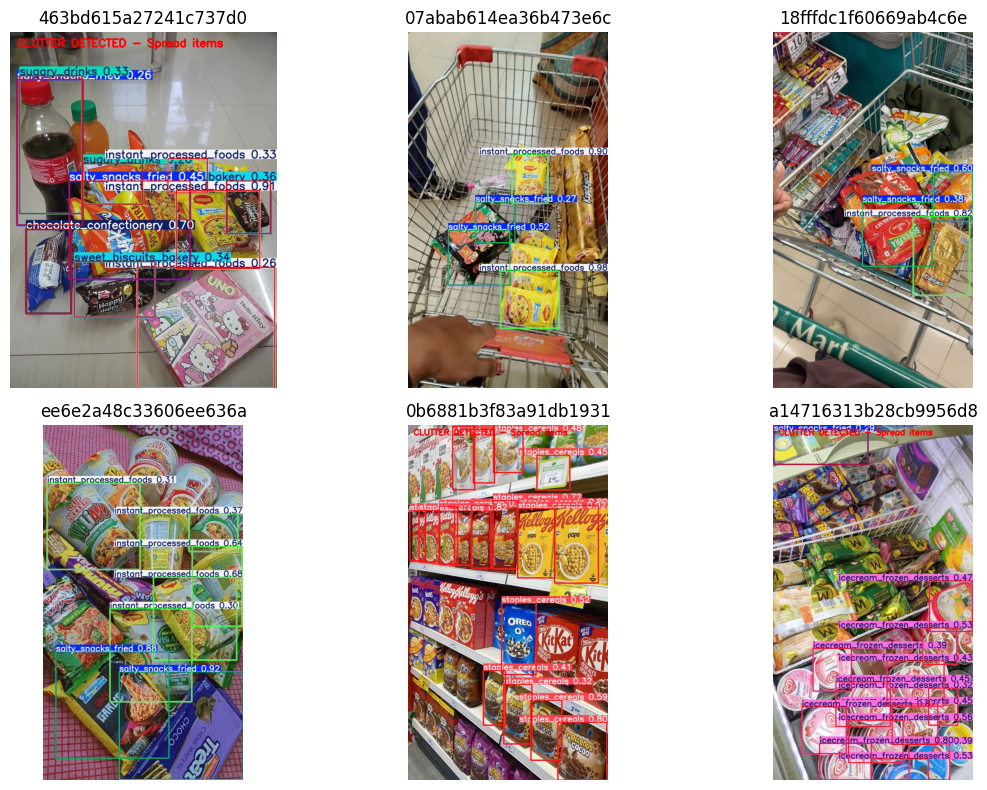

In [ ]:
import os
import random
from PIL import Image
import matplotlib.pyplot as plt

OUT_DIR = "/content/drive/MyDrive/final_year_project/custom_od_project/predictions/final_7class_valid_preds/processed/images"

images = random.sample(os.listdir(OUT_DIR), 6)

plt.figure(figsize=(12,8))

for i, img_name in enumerate(images):
    img_path = os.path.join(OUT_DIR, img_name)
    img = Image.open(img_path)

    plt.subplot(2,3,i+1)
    plt.imshow(img)
    plt.title(img_name[:20])
    plt.axis("off")

plt.tight_layout()
plt.show()

### Visual Validation – Scene Complexity and Detection Behavior

The above outputs illustrate the system performance on real-world grocery scenes, including both cart-level and shelf-level images.

#### Key Observations

- The model successfully detects multiple product categories within a single frame, even under occlusion and overlap.
- Cart-based images generally exhibit cleaner detections with moderate object density.
- Shelf-based images show higher object density and overlapping products, increasing detection complexity.

#### Scene-Level Intelligence

A rule-based post-processing layer evaluates scene complexity using:
- bounding box overlap (IoU)
- number of detected objects
- average confidence score

Based on these signals, the system classifies scenes into:
- **Clear scenes** → suitable for direct SKU mapping and scoring
- **Cluttered scenes** → flagged for potential refinement

#### Examples from Output

- Images with dense shelf arrangements are correctly flagged as **"CLUTTER DETECTED"**
- Cart-based images with fewer overlaps are treated as **valid for downstream processing**
- Mixed-category detection (snacks, drinks, confectionery) is handled effectively

#### Significance

This step ensures that:
- unreliable detections are identified early
- downstream SKU mapping is applied only when confidence is sufficient
- the system behaves robustly in real-world retail environments

This transition from object detection to scene-aware decision making is critical for practical deployment.

The remaining scope involves further refinement through additional real-world images to better tune scene complexity thresholds. We also plan to explore segmentation-based approaches such as MobileSAM to better handle occlusions before performing SKU mapping.


#sku mapping

### SKU Mapping and Initial Health Scoring Results

The SKU processing pipeline successfully converted a raw list of 3,674 product entries into a structured and health-aware dataset.

#### Dataset Summary
- Total SKUs processed: 3,674  
- Mapped (food items): 1,678  
- Unmapped / excluded: 1,996  

A significant portion of SKUs were excluded as they correspond to non-food or ambiguous products. This filtering ensures that downstream analysis operates only on relevant food items.

---

#### Category Distribution

The mapped SKUs are distributed across key food categories:

- staples_cereals → 364  
- sugary_drinks → 299  
- sweet_biscuits_bakery → 241  
- salty_snacks_fried → 198  
- dairy_products → 181  
- instant_processed_foods → 129  
- spreads_sugary_fatty → 123  
- chocolate_confectionery → 96  
- bread_refined → 20  
- water → 15  
- icecream_frozen_desserts → 12  

This distribution reflects a realistic retail mix, with higher representation of staples and commonly consumed packaged foods.

---

#### Health Scoring Observations

Each mapped SKU is assigned a health score (0–10) and a corresponding risk level:

- High scores (7–10): staples_cereals, water  
- Moderate scores (3–6): bakery items, biscuits  
- Low scores (0–3): sugary drinks, confectionery  

Examples:
- Almond-based products → high scores (≈7.5), categorized as "better"  
- Sugary beverages → low scores (≈2.0), categorized as "high_risk"  
- Refined bakery products → moderate scores (≈3.5)  

---

#### Interpretation

- The scoring system correctly distinguishes between nutrient-dense foods and highly processed items  
- Staple and natural products consistently receive higher scores  
- Ultra-processed and sugar-rich items are appropriately penalized  

This step establishes a reliable **nutrition-aware foundation**, enabling subsequent subtype refinement and recommendation generation.

In [ ]:
import re
import pandas as pd
from pathlib import Path

# =========================================================
# PATHS
# =========================================================
TXT_PATH = "/content/drive/MyDrive/final_year_project/custom_od_project/sku_mapping/sku_list.txt"
OUT_DIR = "/content/drive/MyDrive/final_year_project/custom_od_project/sku_mapping"
Path(OUT_DIR).mkdir(parents=True, exist_ok=True)

MASTER_V2 = f"{OUT_DIR}/sku_mapping_master_v2.csv"
CLEAN_V2 = f"{OUT_DIR}/sku_mapping_clean_v2.csv"
SCORED_V2 = f"{OUT_DIR}/sku_health_scored_v2.csv"

# =========================================================
# HELPERS
# =========================================================
def normalize_name_v2(name: str) -> str:
    n = str(name).lower().replace("_", " ").replace("-", " ")
    n = re.sub(r"[^a-z0-9\s&'/]", " ", n)
    n = re.sub(r"\s+", " ", n).strip()
    return n

def has_any_v2(n: str, keywords):
    return any(k in n for k in keywords)

# =========================================================
# NON-FOOD EXCLUSION
# =========================================================
NON_FOOD_KEYWORDS = [
    "toothpaste", "tooth brush", "toothbrush", "mouthwash", "mouth wash",
    "soap", "shampoo", "conditioner", "detergent", "fabric conditioner",
    "cleaner", "floor cleaner", "glass cleaner", "toilet cleaner",
    "bathroom cleaner", "dishwash", "dish wash", "handwash", "hand wash",
    "sanitizer", "deodorant", "perfume", "lotion", "facewash", "face wash",
    "face cream", "bodywash", "body wash", "body lotion", "body spray",
    "hair oil", "hair serum", "hair color", "haircolour", "razor",
    "shaving", "trimmer", "blade", "diaper", "diapers", "sanitary",
    "pads", "napkin", "repellent", "mosquito", "air freshner",
    "airfreshner", "room freshner", "roomfreshner", "freshener",
    "odonil", "harpic", "lizol", "vim", "rin", "surf", "tide",
    "stayfree", "whisper", "dettol", "savlon", "vaseline", "ponds",
    "boroplus", "boroline", "pepsodent", "sensodyne", "colgate",
    "closeup", "close up", "oral b", "oral-b", "listerine",
    "makeup", "lipstick", "lip balm", "kajal", "eyeliner"
]

# =========================================================
# FOOD CLASS MAPPING
# =========================================================
def map_to_final_class_v4(raw_name: str):
    n = normalize_name_v2(raw_name)

    if has_any_v2(n, NON_FOOD_KEYWORDS):
        return None

    if has_any_v2(n, [
        "water aquafina", "water bisleri", "water kinley", "water aava",
        "water aqua", "water bindu", "water himalayan", "water smart",
        "water vedica", "water evocus", "mineral water", "mineralwater",
        "alkaline water", "spring water", "sparkling water", "soda water"
    ]):
        return "water"

    if has_any_v2(n, [
        "softdrink", "soft drink", "cola", "coke", "coca cola", "pepsi",
        "sprite", "fanta", "thums up", "thumsup", "mirinda", "7up",
        "mountain dew", "maaza", "slice", "tropicana", "real",
        "paper boat", "appy", "frooti", "fruity", "juice", "fruit drink",
        "energy drink", "redbull", "red bull", "sting", "nimbooz",
        "rooh afza", "amul kool", "badam drink", "almond drink",
        "milkshake", "lassi", "iced tea", "nestea", "tang", "rasna",
        "minute maid", "minutemaid", "smoodh", "winkin cow", "cavins",
        "sofit"
    ]):
        return "sugary_drinks"

    if has_any_v2(n, [
        "icecream", "ice cream", "kulfi", "chocobar", "ice popps",
        "skippi", "frozen dessert"
    ]):
        return "icecream_frozen_desserts"

    if has_any_v2(n, [
        "chocolate", "cadbury", "dairymilk", "dairy milk", "kitkat",
        "kit kat", "perk", "munch", "5star", "5 star", "snickers",
        "mars", "twix", "toblerone", "gems", "eclairs", "toffee",
        "candy", "lollipop", "marshmallow", "alpenliebe", "melody",
        "mentos", "skittles", "kisses", "fuse", "fusebites",
        "celebrations", "milky bar", "milkybar", "choco pie", "chocopie",
        "kinderjoy", "kinder joy", "hersheys", "hershey's"
    ]):
        return "chocolate_confectionery"

    if has_any_v2(n, [
        "ketchup", "tomato sauce", "jam", "nutella", "mayo",
        "mayonnaise", "peanut butter", "peanutbutter", "spread",
        "chutney", "dip", "syrup", "squash", "choco spread",
        "sandwich spread", "pizza pasta sauce", "schezwan sauce",
        "chilli sauce", "hot sweet sauce", "mustard sauce",
        "barbeque sauce", "bbq sauce", "salsa"
    ]):
        return "spreads_sugary_fatty"

    if has_any_v2(n, [
        "chips", "kurkure", "namkeen", "bhujia", "sev", "mixture",
        "chiwda", "bhelpuri", "nacho", "nachos", "murukku",
        "tedhe medhe", "mad angles", "aloo bhujia", "khatta meetha",
        "moong dal", "soya sticks", "peanuts", "makhana", "chakli",
        "khakhra", "fulvadi", "mathri", "bhakarwadi", "cornitos",
        "doritos", "pringles", "too yumm", "halke fulke",
        "uncle chipps", "jabsons", "tasty nuts", "punjabi tadka",
        "snactac", "roasted chana"
    ]):
        return "salty_snacks_fried"

    if has_any_v2(n, [
        "biscuit", "biscuits", "cookie", "cookies", "oreo", "parle g",
        "good day", "goodday", "monaco", "cracker", "rusk",
        "cake", "brownie", "muffin", "croissant", "wafer",
        "hide seek", "hide&seek", "bourbon", "marie", "jim jam",
        "milk bikis", "nutrichoice", "dark fantasy", "50 50",
        "krackjack", "little hearts", "littlehearts", "gobbles",
        "swiss roll", "plum cake", "tea cake", "fruit cake",
        "milano", "fab", "malkist"
    ]):
        return "sweet_biscuits_bakery"

    if has_any_v2(n, [
        "bread", "bun", "buns", "pav", "kulcha", "burger bun",
        "pizza base", "toast"
    ]):
        return "bread_refined"

    if has_any_v2(n, [
        "noodles", "noodle", "maggi", "top ramen", "ramen", "cup noodles",
        "cupnoodles", "pasta", "macaroni", "soup", "upma mix", "vermicelli",
        "idli mix", "dosa mix", "uttapam", "instant tadka", "masala oats",
        "oats idli", "rava idli", "wai wai", "yippee", "ching's", "knorr",
        "french fries", "fries", "mccain", "veggie fingers", "veggie nuggets",
        "smiles", "potato bites", "cheese shotz", "frozen food", "frozen snack"
    ]):
        return "instant_processed_foods"

    if has_any_v2(n, [
        "milk", "curd", "dahi", "paneer", "cheese", "butter", "ghee",
        "yogurt", "yoghurt", "fresh cream", "freshcream",
        "amul taaza", "amul gold", "amul masti", "milkmaid",
        "cheese slices", "cheese cubes", "buttermilk"
    ]):
        return "dairy_products"

    if has_any_v2(n, [
        "rice", "atta", "flour", "oats", "muesli", "corn flakes",
        "cornflakes", "cereal", "poha", "suji", "rava", "dalia", "dal",
        "besan", "maida", "ragi", "bajra", "jowar", "sabudana", "quinoa",
        "chia", "flax", "rajma", "chana", "pulses", "sattu", "honey",
        "dry fruit", "dryfruit", "raisins", "almonds", "cashews",
        "walnuts", "pistachios", "seed mix", "granola", "cerelac",
        "horlicks", "boost", "complan", "protinex", "jaggery",
        "brown rice", "whole wheat", "multigrain"
    ]):
        return "staples_cereals"

    return None

with open(TXT_PATH, "r", encoding="utf-8", errors="ignore") as f:
    lines = f.readlines()

records = []
start_collecting = False

for line in lines:
    line = line.strip()
    if "S. No." in line and "Class names" in line:
        start_collecting = True
        continue
    if not start_collecting:
        continue

    m = re.match(r"^(\d+)\s+(.+)$", line)
    if m:
        sku_id = int(m.group(1))
        raw_name = m.group(2).strip()
        records.append({"sku_id": sku_id, "raw_name": raw_name})

df = pd.DataFrame(records)

df["normalized_name"] = df["raw_name"].apply(normalize_name_v2)
df["mapped_class"] = df["raw_name"].apply(map_to_final_class_v4)
df["is_mapped"] = df["mapped_class"].notna().astype(int)
df["needs_review"] = (df["mapped_class"].isna()).astype(int)
df["image_path"] = ""

df.to_csv(MASTER_V2, index=False)

clean_df = df[df["mapped_class"].notna()].copy()
clean_df.to_csv(CLEAN_V2, index=False)

base_scores = {
    "staples_cereals": 7.5,
    "dairy_products": 6.5,
    "water": 10.0,
    "bread_refined": 4.5,
    "sweet_biscuits_bakery": 3.5,
    "salty_snacks_fried": 2.5,
    "sugary_drinks": 2.0,
    "chocolate_confectionery": 2.5,
    "icecream_frozen_desserts": 2.5,
    "spreads_sugary_fatty": 3.0,
    "instant_processed_foods": 2.5,
}

positive_rules = {
    "baked": 1.0,
    "roasted": 1.2,
    "whole wheat": 1.2,
    "wholewheat": 1.2,
    "multigrain": 1.0,
    "oats": 1.0,
    "high fiber": 1.0,
    "fiber": 0.8,
    "fibre": 0.8,
    "low sugar": 1.0,
    "zero sugar": 1.5,
    "no added sugar": 1.2,
    "plain": 0.8,
    "unsweetened": 1.3,
    "brown rice": 1.2,
    "ragi": 1.2,
    "jowar": 1.2,
    "bajra": 1.2,
}

negative_rules = {
    "fried": -1.2,
    "salted": -0.6,
    "cream": -0.8,
    "choco": -0.8,
    "chocolate": -0.8,
    "cola": -1.0,
    "softdrink": -1.0,
    "soft drink": -1.0,
    "instant": -1.0,
    "sweetened": -1.0,
    "sugar": -0.8,
    "caramel": -0.8,
    "double choc": -1.0,
    "milkshake": -1.2,
}

def compute_health_score(row):
    name = normalize_name_v2(row["normalized_name"])
    mapped_class = row["mapped_class"]

    score = base_scores.get(mapped_class, 5.0)

    for kw, val in positive_rules.items():
        if kw in name:
            score += val

    for kw, val in negative_rules.items():
        if kw in name:
            score += val

    if mapped_class == "sugary_drinks":
        if "zero sugar" in name or "unsweetened" in name:
            score += 1.0
        if "cola" in name or "softdrink" in name:
            score -= 0.5

    if mapped_class == "salty_snacks_fried":
        if "roasted" in name:
            score += 1.2
        if "chips" in name or "bhujia" in name:
            score -= 0.4

    if mapped_class == "sweet_biscuits_bakery":
        if "dark fantasy" in name or "bourbon" in name or "oreo" in name:
            score -= 0.4
        if "cracker" in name:
            score += 0.2

    if mapped_class == "instant_processed_foods":
        if "oats" in name:
            score += 0.7
        if "noodles" in name or "maggi" in name:
            score -= 0.5

    if mapped_class == "dairy_products":
        if "milk" in name or "curd" in name or "paneer" in name:
            score += 0.4
        if "cream" in name:
            score -= 0.6

    score = max(0, min(10, round(score, 2)))
    return score

def risk_band(score):
    if score < 3:
        return "high_risk"
    elif score < 6:
        return "moderate"
    elif score <= 8:
        return "better"
    return "healthiest"

def get_reason(row):
    cls = row["mapped_class"]
    score = row["health_score"]
    reasons = {
        "salty_snacks_fried": "fried snack, likely high salt and low fiber",
        "sweet_biscuits_bakery": "refined flour and sugar-heavy bakery item",
        "instant_processed_foods": "processed instant food, likely high sodium",
        "sugary_drinks": "sweetened beverage with low satiety",
        "chocolate_confectionery": "high sugar / confectionery product",
        "icecream_frozen_desserts": "dessert item with sugar and fat load",
        "spreads_sugary_fatty": "spread likely high in sugar or fat",
        "staples_cereals": "staple or cereal product with relatively better base nutrition",
        "dairy_products": "plain dairy product with better protein/calcium profile",
        "bread_refined": "refined bread product with lower fiber",
        "water": "hydration-friendly no-calorie beverage"
    }
    return reasons.get(cls, "class-based nutrition profile applied") + f"; score={score}/10"

scored_df = clean_df.copy()
scored_df["health_score"] = scored_df.apply(compute_health_score, axis=1)
scored_df["risk_level"] = scored_df["health_score"].apply(risk_band)
scored_df["reason"] = scored_df.apply(get_reason, axis=1)

scored_df.to_csv(SCORED_V2, index=False)

print("Saved:", MASTER_V2)
print("Saved:", CLEAN_V2)
print("Saved:", SCORED_V2)

print("\nTotal SKUs:", len(df))
print("Mapped:", int(df["is_mapped"].sum()))
print("Unmapped:", int(df["needs_review"].sum()))

print("\nMapped class counts:")
print(df["mapped_class"].value_counts(dropna=False))

print("\nSample scored rows:")
print(scored_df[["raw_name", "mapped_class", "health_score", "risk_level"]].head(20))

Saved: /content/drive/MyDrive/final_year_project/custom_od_project/sku_mapping/sku_mapping_master_v2.csv
Saved: /content/drive/MyDrive/final_year_project/custom_od_project/sku_mapping/sku_mapping_clean_v2.csv
Saved: /content/drive/MyDrive/final_year_project/custom_od_project/sku_mapping/sku_health_scored_v2.csv

Total SKUs: 3674
Mapped: 1678
Unmapped: 1996

Mapped class counts:
mapped_class
None                        1996
staples_cereals              364
sugary_drinks                299
sweet_biscuits_bakery        241
salty_snacks_fried           198
dairy_products               181
instant_processed_foods      129
spreads_sugary_fatty         123
chocolate_confectionery       96
bread_refined                 20
water                         15
icecream_frozen_desserts      12
Name: count, dtype: int64

Sample scored rows:
                      raw_name             mapped_class  health_score  \
2               50 50 Gol Maal    sweet_biscuits_bakery           3.5   
3        50 50 sw

In [ ]:
!pip install ultralytics


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 21.4 MB/s eta 0:00:00


### Final End-to-End Inference and Recommendation Pipeline

This code block demonstrates the complete working system by integrating object detection with health-aware analysis.

#### What this code does

1. **Loads trained YOLO model**
   - Detects grocery items from a real shelf image

2. **Loads precomputed SKU intelligence**
   - Uses `sku_health_scored_v3.csv` containing:
     - mapped_class
     - subtype
     - health_score
     - risk_level

3. **Runs object detection**
   - Identifies product categories present in the image

4. **Maps detection → health understanding**
   - Assigns default subtype for each detected class  
   - Retrieves health scores and reasoning  
   - Generates healthier alternatives  

5. **Performs cart-level analysis**
   - Computes overall cart score  
   - Classifies cart as unhealthy / moderate / better  
   - Summarizes item distribution  

6. **Displays results**
   - Annotated image with detections  
   - Detailed, explainable recommendation report  

---

#### Purpose

This block represents the **final system output**, showing how the pipeline converts:

**Image → Detected Products → Health Scores → Recommendations**

It demonstrates the transition from computer vision to actionable decision intelligence.

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.

image 1/1 /content/drive/MyDrive/final_year_project/custom_od_project/extracted/dataset_yolo_remapped_7class_split/valid/images/84be30e76777c786d559f2f44dbf5bb5_jpg.rf.j0AhauumXeEy0ETWypLO.jpg: 640x384 8 salty_snacks_frieds, 1 sweet_biscuits_bakery, 1 instant_processed_foods, 1 sugary_drinks, 346.3ms
Speed: 13.4ms preprocess, 346.3ms inference, 47.4ms postprocess per image at shape (1, 3, 640, 384)
Detected: salty_snacks_fried           conf=0.896
Detected: salty_snacks_fried           conf=0.810
Detected: salty_snacks_fried           conf=0.806
Detected: salty_snacks_fried           conf=0.740
Detected: salty_snacks_fried           conf=0.729
Detected: sweet_biscuits_bakery     

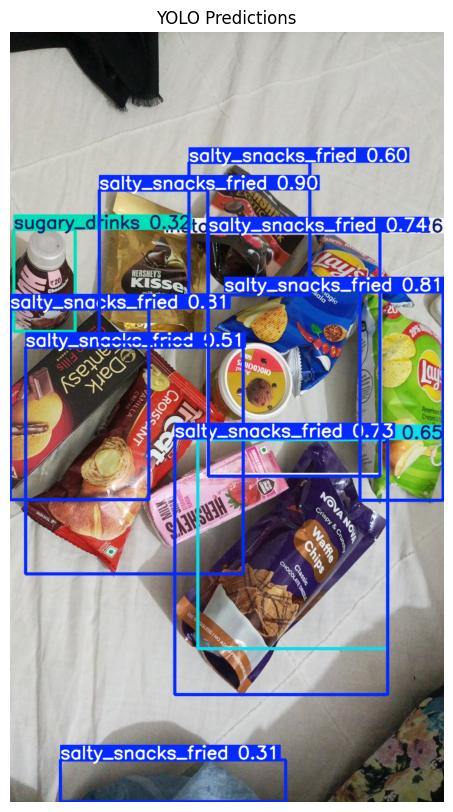

CART SCORE: 2.55/10 → Unhealthy cart

Detected: salty_snacks_fried (x8)
Assumed Subtype: chips
Health Score: 2.5/10
Reason: fried snack category, likely high salt and low fiber
Better Alternatives:
  • PlainKhakhra_Talod (khakhra) score=7.1
  • JeeraKhakhra_Talod (khakhra) score=6.3
  • Khakhra_ShantaG (khakhra) score=6.3

Detected: sweet_biscuits_bakery (x1)
Assumed Subtype: cream_biscuit
Health Score: 3.5/10
Reason: refined flour and sugar-heavy bakery category
Better Alternatives:
  • Biscuit_Cracker_NutriChoice_Britannia (cracker) score=4.7
  • Biscuit_Nutrichoice_Cracker_Britannia (cracker) score=4.7
  • Cracker_NutriChoiceDigestive_Britannia (cracker) score=4.7

Detected: sugary_drinks (x1)
Assumed Subtype: soft_drink
Health Score: 2.0/10
Reason: sweetened beverage category with low satiety
Better Alternatives:
  • AlkalineWater_EvocusH20 (water) score=10.0
  • CarbonatedWater_Kinley (water) score=10.0
  • MineralWater_Kinley (water) score=10.0

Detected: instant_processed_foods 

In [ ]:
# ============================================
# 1) LOAD MODEL + SCORED SKU FILE (V3)
# ============================================
from ultralytics import YOLO
from collections import Counter
import pandas as pd
import matplotlib.pyplot as plt

MODEL_PATH = "/content/drive/MyDrive/final_year_project/custom_od_project/final_runs/final_remapped_7class_e1002/weights/best.pt"
CSV_PATH = "/content/drive/MyDrive/final_year_project/custom_od_project/sku_mapping/sku_health_scored_v3.csv"

model = YOLO(MODEL_PATH)
sku_df = pd.read_csv(CSV_PATH)
sku_df["norm_name"] = sku_df["raw_name"].astype(str).str.lower().str.replace("_", " ", regex=False)

class_names = {
    0: "salty_snacks_fried",
    1: "sweet_biscuits_bakery",
    2: "instant_processed_foods",
    3: "sugary_drinks",
    4: "chocolate_confectionery",
    5: "icecream_frozen_desserts",
    6: "staples_cereals",
}

class_default_scores = {
    "salty_snacks_fried": 2.5,
    "sweet_biscuits_bakery": 3.5,
    "instant_processed_foods": 2.5,
    "sugary_drinks": 2.0,
    "chocolate_confectionery": 2.5,
    "icecream_frozen_desserts": 2.5,
    "staples_cereals": 7.5,
    "dairy_products": 6.5,
    "water": 10.0,
    "bread_refined": 4.5,
    "spreads_sugary_fatty": 3.0,
}

class_reasons = {
    "salty_snacks_fried": "fried snack category, likely high salt and low fiber",
    "sweet_biscuits_bakery": "refined flour and sugar-heavy bakery category",
    "instant_processed_foods": "processed instant food category, likely high sodium",
    "sugary_drinks": "sweetened beverage category with low satiety",
    "chocolate_confectionery": "high sugar confectionery category",
    "icecream_frozen_desserts": "dessert category with sugar/fat load",
    "staples_cereals": "staple category with better base nutrition potential",
    "dairy_products": "plain dairy category with better protein/calcium profile",
    "water": "hydration-friendly no-calorie beverage",
    "bread_refined": "refined bread category with lower fiber",
    "spreads_sugary_fatty": "spread category likely high in sugar or fat",
}

# ============================================
# 2) DEFAULT SUBTYPE PER DETECTED CLASS
#    (used because YOLO gives class, not subtype)
# ============================================
default_subtype_map = {
    "salty_snacks_fried": "chips",
    "sweet_biscuits_bakery": "cream_biscuit",
    "instant_processed_foods": "noodles",
    "sugary_drinks": "soft_drink",
    "chocolate_confectionery": "chocolate",
    "icecream_frozen_desserts": "icecream",
    "staples_cereals": "breakfast_cereal",
    "dairy_products": "milk",
    "water": "water",
    "bread_refined": "bread",
}

# ============================================
# 3) SUBTYPE-AWARE RECOMMENDATION TERMS
# ============================================
subtype_recommendations = {
    "chips": ["khakhra", "roasted makhana", "roasted chana"],
    "namkeen": ["roasted chana", "khakhra", "roasted peanuts"],
    "makhana": ["plain roasted makhana", "khakhra", "roasted chana"],
    "peanuts": ["roasted peanuts", "roasted chana", "khakhra"],
    "khakhra": ["khakhra", "roasted chana", "roasted makhana"],
    "general_snack": ["khakhra", "roasted chana", "roasted makhana"],

    "soft_drink": ["water", "zero sugar", "buttermilk"],
    "fruit_drink": ["coconut water", "water", "unsweetened"],
    "energy_drink": ["water", "coconut water", "buttermilk"],
    "sweet_dairy_drink": ["plain buttermilk", "unsweetened lassi", "milk"],
    "general_drink": ["water", "buttermilk", "unsweetened"],

    "noodles": ["oats", "poha", "upma"],
    "pasta": ["whole wheat pasta", "oats pasta", "vermicelli"],
    "soup": ["plain soup", "oats soup", "homestyle soup"],
    "quick_meal": ["oats", "dalia", "poha"],
    "general_instant": ["oats", "poha", "dalia"],

    "cream_biscuit": ["digestive", "oats biscuit", "cracker"],
    "cracker": ["multigrain cracker", "oats cracker", "high fiber"],
    "cookie": ["oats biscuit", "digestive", "plain biscuit"],
    "cake": ["rusk", "plain biscuit", "oats biscuit"],
    "rusk": ["whole wheat rusk", "cracker", "digestive"],
    "general_biscuit": ["digestive", "oats biscuit", "cracker"],

    "chocolate": ["dark chocolate", "nuts", "dates"],
    "candy": ["dates", "raisins", "nuts"],
    "general_confectionery": ["dark chocolate", "dates", "nuts"],

    "icecream": ["plain yogurt", "curd", "unsweetened yogurt"],

    "breakfast_cereal": ["oats", "muesli", "multigrain"],
    "flour": ["multigrain atta", "ragi flour", "bajra flour"],
    "grain_base": ["brown rice", "dalia", "oats"],
    "pulses": ["dal", "chana", "rajma"],
    "nuts_dryfruit": ["almonds", "walnuts", "mixed nuts"],

    "milk": ["plain milk", "curd", "paneer"],
    "curd_yogurt": ["plain curd", "yogurt", "buttermilk"],
    "paneer": ["paneer", "curd", "milk"],
    "cheese": ["paneer", "curd", "milk"],
    "butter": ["paneer", "curd", "milk"],
}

# ============================================
# 4) HELPERS
# ============================================
def get_candidates_from_terms(terms, top_k=3):
    parts = []
    for term in terms:
        sub = sku_df[sku_df["norm_name"].str.contains(term, na=False)].copy()
        parts.append(sub)

    if not parts:
        return []

    out = pd.concat(parts).drop_duplicates(subset=["raw_name"])
    out = out.sort_values(["health_score", "raw_name"], ascending=[False, True]).head(top_k)

    return out[["raw_name", "mapped_class", "subtype", "health_score", "risk_level"]].to_dict(orient="records")

def recommend_from_subtype(subtype, mapped_class=None, top_k=3):
    terms = subtype_recommendations.get(subtype, [])
    recs = get_candidates_from_terms(terms, top_k=top_k)

    if len(recs) >= top_k:
        return recs

    if mapped_class:
        fallback = sku_df[sku_df["mapped_class"] == mapped_class].copy()
        fallback = fallback.sort_values(["health_score", "raw_name"], ascending=[False, True]).head(top_k)
        return fallback[["raw_name", "mapped_class", "subtype", "health_score", "risk_level"]].to_dict(orient="records")

    return recs

def get_recommendations_final(detected_class, top_k=3):
    subtype = default_subtype_map.get(detected_class, "general")
    recs = recommend_from_subtype(subtype, mapped_class=detected_class, top_k=top_k)
    return {
        "class": detected_class,
        "subtype": subtype,
        "recommendations": recs
    }

def final_cart_analysis(detected_classes):
    counts = Counter(detected_classes)

    item_outputs = []
    scores = []

    for cls, count in counts.items():
        rec = get_recommendations_final(cls)
        base_score = class_default_scores.get(cls, 5.0)

        item_outputs.append({
            "class": cls,
            "count": count,
            "score": base_score,
            "reason": class_reasons.get(cls, "class-based health reasoning"),
            "subtype": rec["subtype"],
            "recommendations": rec["recommendations"]
        })

        scores.extend([base_score] * count)

    cart_score = round(sum(scores) / len(scores), 2) if scores else 0

    if cart_score < 3:
        label = "Unhealthy cart"
    elif cart_score < 6:
        label = "Moderate cart"
    else:
        label = "Better cart"

    return cart_score, label, item_outputs

def print_final_output(cart_score, label, items):
    print("=" * 70)
    print(f"CART SCORE: {cart_score}/10 → {label}")
    print("=" * 70)

    for item in items:
        print(f"\nDetected: {item['class']} (x{item['count']})")
        print(f"Assumed Subtype: {item['subtype']}")
        print(f"Health Score: {item['score']}/10")
        print(f"Reason: {item['reason']}")
        print("Better Alternatives:")
        for r in item["recommendations"]:
            print(f"  • {r['raw_name']} ({r['subtype']}) score={r['health_score']}")

# ============================================
# 5) TEST ON ONE IMAGE
# ============================================
IMG_PATH = "/content/drive/MyDrive/final_year_project/custom_od_project/extracted/dataset_yolo_remapped_7class_split/valid/images/84be30e76777c786d559f2f44dbf5bb5_jpg.rf.j0AhauumXeEy0ETWypLO.jpg"  # change if needed

results = model.predict(
    source=IMG_PATH,
    imgsz=640,
    conf=0.25,
    iou=0.45,
    save=False
)

r = results[0]

detected_classes = []
if r.boxes is not None and len(r.boxes) > 0:
    for box in r.boxes:
        cls_id = int(box.cls.item())
        conf = float(box.conf.item())
        cls_name = class_names[cls_id]
        detected_classes.append(cls_name)
        print(f"Detected: {cls_name:28s} conf={conf:.3f}")
else:
    print("No detections found")

# Show annotated image
annotated = r.plot()
plt.figure(figsize=(10, 10))
plt.imshow(annotated[:, :, ::-1])
plt.axis("off")
plt.title("YOLO Predictions")
plt.show()

# Cart analysis
cart_score, label, items = final_cart_analysis(detected_classes)
print_final_output(cart_score, label, items)

### End-to-End Inference and Recommendation Output

The system was evaluated on a real basket image containing multiple food items.

#### Detection Summary
The model detected:
- 8 salty_snacks_fried  
- 1 sweet_biscuits_bakery  
- 1 sugary_drinks  
- 1 instant_processed_foods  

This indicates a snack-heavy basket dominated by processed foods.

---

#### Cart-Level Result
- **Cart Score: 2.55 / 10**
- **Label: Unhealthy cart**

The low score is driven by the high presence of fried snacks, sugary drinks, and processed items.

---

#### Key Insight
The system not only detects products but also:
- identifies unhealthy dominance (snacks)
- assigns interpretable health scores
- recommends better alternatives (e.g., khakhra, oats, water)

---

#### Conclusion
This demonstrates a complete pipeline from **visual detection to actionable health recommendations**, enabling smarter grocery decisions.